In [2]:
!pip install scanpy

In [3]:
import scanpy as sc

In [4]:
adata = sc.read_csv('GSE171524_RAW/GSM5226574_C51ctr_raw_counts.csv.gz').T
adata

AnnData object with n_obs × n_vars = 6099 × 34546

In [5]:
adata.X.shape

(6099, 34546)

# Doublet removal - optional but preferred

In [6]:
import scvi

In [15]:
adata

AnnData object with n_obs × n_vars = 6099 × 2000
    var: 'n_cells', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'hvg'

In [13]:
sc.pp.filter_genes(adata, min_cells = 10)#保留至少在10个细胞中出现的基因

In [ ]:
sc.pp.highly_variable_genes(adata, n_top_genes = 2000, subset = True, flavor = 'seurat_v3')#使用seurat_v3方法选择2000个高变基因，此时adata为6099 × 2000

接下来运行的三行代码背后的模型叫 SCVI (single-cell Variational Inference)。 它的逻辑是：不再用简单的数学公式去算差异，而是让 AI 学习你数据的概率分布。它能自动识别哪些是生物学差异（细胞类型），哪些是技术噪音（批次效应、测序深度波动）。

In [16]:
scvi.model.SCVI.setup_anndata(adata)
vae = scvi.model.SCVI(adata)
vae.train()

GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|██████████| 400/400 [03:22<00:00,  1.97it/s, v_num=1, train_loss_step=356, train_loss_epoch=322]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [03:22<00:00,  1.97it/s, v_num=1, train_loss_step=356, train_loss_epoch=322]


SOLO 是基于你刚才训练好的 vae 模型建立的一个专门用来“识别双细胞”的分类器。它会利用 vae 学到的规律，在后台生成一批“模拟双细胞”（把两个随机细胞的数值加起来），然后训练自己识别“双细胞”与“真实细胞”的区别。

In [17]:
solo = scvi.external.SOLO.from_scvi_model(vae)
solo.train()

INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 300/400:  75%|███████▌  | 300/400 [00:48<00:16,  6.13it/s, v_num=1, train_loss_step=0.223, train_loss_epoch=0.296]
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.275. Signaling Trainer to stop.


In [32]:
df = solo.predict()#返回每个细胞属于每个类别的概率
df['prediction'] = solo.predict(soft = False)#
df

/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)


,doublet,singlet,prediction
TAGGTACCATGGCCAC-1_1,0.895567,0.104433,doublet
ATTCACTGTAACAGGC-1_1,0.723033,0.276967,doublet
TAACTTCCAACCACGC-1_1,0.640246,0.359754,doublet
TTGGGTACACGACAAG-1_1,0.847377,0.152623,doublet
AGGCCACAGAGTCACG-1_1,0.706833,0.293167,doublet
...,...,...,...
CGCCATTGTTTGCCGG-1_1,0.106703,0.893297,singlet
CACTGGGGTCTACGTA-1_1,0.001582,0.998418,singlet
CATACTTGTAGAGGAA-1_1,0.003796,0.996204,singlet
TTTGGTTTCCACGGAC-1_1,0.003784,0.996216,singlet


In [ ]:
adata.obs.index[0]#不需要和视频一样去除最后两位，二者ID一致

'TAGGTACCATGGCCAC-1_1'

In [34]:
df.groupby('prediction').count()

,doublet,singlet
prediction,,
doublet,1293,1293
singlet,4806,4806


In [ ]:
df['dif'] = df.doublet - df.singlet
df

,doublet,singlet,prediction,dif
TAGGTACCATGGCCAC-1_1,0.895567,0.104433,doublet,0.791133
ATTCACTGTAACAGGC-1_1,0.723033,0.276967,doublet,0.446066
TAACTTCCAACCACGC-1_1,0.640246,0.359754,doublet,0.280492
TTGGGTACACGACAAG-1_1,0.847377,0.152623,doublet,0.694753
AGGCCACAGAGTCACG-1_1,0.706833,0.293167,doublet,0.413666
...,...,...,...,...
CGCCATTGTTTGCCGG-1_1,0.106703,0.893297,singlet,-0.786593
CACTGGGGTCTACGTA-1_1,0.001582,0.998418,singlet,-0.996836
CATACTTGTAGAGGAA-1_1,0.003796,0.996204,singlet,-0.992407
TTTGGTTTCCACGGAC-1_1,0.003784,0.996216,singlet,-0.992432


In [36]:
import seaborn as sns

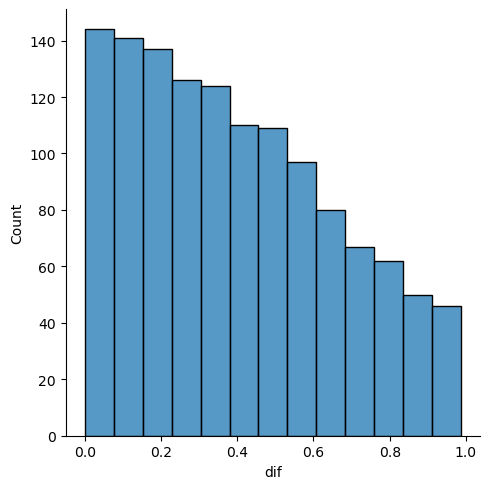

In [37]:
sns.displot(df[df.prediction == 'doublet'], x = 'dif')#判定为双细胞（doublet），画一张dif的分布图

In [40]:
doublets = df[(df.prediction == 'doublet') & (df.dif > 0.5)]#比如筛选那些判定为doublet且概率差值大于0.5的细胞，注意此处与视频不一样。
doublets

,doublet,singlet,prediction,dif
TAGGTACCATGGCCAC-1_1,0.895567,0.104433,doublet,0.791133
TTGGGTACACGACAAG-1_1,0.847377,0.152623,doublet,0.694753
ACTGATGTCTGCACCT-1_1,0.961579,0.038421,doublet,0.923157
TTACCGCCACTCAGAT-1_1,0.889447,0.110553,doublet,0.778894
TGGGAAGTCAGTGATC-1_1,0.930753,0.069247,doublet,0.861506
...,...,...,...,...
ATTCGTTTCCTCAGGG-1_1,0.786902,0.213098,doublet,0.573804
ATCAGGTGTCGTCTCT-1_1,0.879306,0.120694,doublet,0.758612
TGGTACACACTGTCCT-1_1,0.865310,0.134690,doublet,0.730620
GGAGGTAGTTAAGCAA-1_1,0.823025,0.176975,doublet,0.646050


目前已经获得了双细胞的cell barcode，接下来就把原始文件中判定为双细胞的细胞去除。

In [41]:
adata = sc.read_csv('GSE171524_RAW/GSM5226574_C51ctr_raw_counts.csv.gz').T

In [42]:
adata.obs['doublet'] = adata.obs.index.isin(doublets.index)

In [ ]:
adata.obs#双细胞显示为True，单细胞为False

,doublet
TAGGTACCATGGCCAC-1_1,True
ATTCACTGTAACAGGC-1_1,False
TAACTTCCAACCACGC-1_1,False
TTGGGTACACGACAAG-1_1,True
AGGCCACAGAGTCACG-1_1,False
...,...
CGCCATTGTTTGCCGG-1_1,False
CACTGGGGTCTACGTA-1_1,False
CATACTTGTAGAGGAA-1_1,False
TTTGGTTTCCACGGAC-1_1,False


In [44]:
adata = adata[~adata.obs.doublet]#去除双细胞后的单细胞数据集，～为python中的取反操作

In [ ]:
adata#查看去除双细胞后的数据集，目前细胞集一共有5646个细胞，比之前的6099个细胞少了453个双细胞

View of AnnData object with n_obs × n_vars = 5646 × 34546
    obs: 'doublet'

目前已完成去除双细胞的全部操作，接下来是数据预处理阶段。

# Preprocessing

注释线粒体基因，人类线粒体基因为MT开头。

In [54]:
adata.var['mt'] = adata.var.index.str.startswith('MT-')

In [55]:
adata.var

,mt
AL627309.1,False
AL627309.5,False
AL627309.4,False
AL669831.2,False
LINC01409,False
...,...
VN1R2,False
AL031676.1,False
SMIM34A,False
AL050402.1,False


In [56]:
import pandas as pd

In [58]:
ribo_url = "http://software.broadinstitute.org/gsea/msigdb/download_geneset.jsp?geneSetName=KEGG_RIBOSOME&fileType=txt"
#导入布罗德研究所的核糖体基因集

In [59]:
ribo_genes = pd.read_table(ribo_url, skiprows=2, header = None)#真正的基因名单是从第三行开始的，所以跳过前两行
ribo_genes

,0
0,FAU
1,MRPL13
2,RPL10
3,RPL10A
4,RPL10L
...,...
83,RPS9
84,RPSA
85,RSL24D1
86,RSL24D1P11


In [61]:
ribo_genes[0].values#values的作用是去掉索引（Index），只拿走里面的数据内容

array(['FAU', 'MRPL13', 'RPL10', 'RPL10A', 'RPL10L', 'RPL11', 'RPL12',
       'RPL13', 'RPL13A', 'RPL14', 'RPL15', 'RPL17', 'RPL18', 'RPL18A',
       'RPL19', 'RPL21', 'RPL22', 'RPL22L1', 'RPL23', 'RPL23A', 'RPL24',
       'RPL26', 'RPL26L1', 'RPL27', 'RPL27A', 'RPL28', 'RPL29', 'RPL3',
       'RPL30', 'RPL31', 'RPL32', 'RPL34', 'RPL35', 'RPL35A', 'RPL36',
       'RPL36A', 'RPL36AL', 'RPL37', 'RPL37A', 'RPL38', 'RPL39', 'RPL3L',
       'RPL4', 'RPL41', 'RPL5', 'RPL6', 'RPL7', 'RPL7A', 'RPL8', 'RPL9',
       'RPLP0', 'RPLP1', 'RPLP2', 'RPS10', 'RPS11', 'RPS12', 'RPS13',
       'RPS15', 'RPS15A', 'RPS16', 'RPS17', 'RPS18', 'RPS19', 'RPS2',
       'RPS20', 'RPS21', 'RPS23', 'RPS24', 'RPS25', 'RPS26', 'RPS27',
       'RPS27A', 'RPS27L', 'RPS28', 'RPS29', 'RPS3', 'RPS3A', 'RPS4X',
       'RPS4Y1', 'RPS5', 'RPS6', 'RPS7', 'RPS8', 'RPS9', 'RPSA',
       'RSL24D1', 'RSL24D1P11', 'UBA52'], dtype=object)

In [ ]:
adata.var['ribo'] = adata.var_names.isin(ribo_genes[0].values)#如果某个基因在核糖体列表里，就返回 True；如果不在，就返回 False

In [ ]:
adata.var.sort_values('n_cells_by_counts')#var是列，对应的是基因，按照基因在细胞中出现的频率排序

,mt,ribo,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts
AL445072.1,False,False,0,0.000000,100.000000,0.0
LINC02358,False,False,0,0.000000,100.000000,0.0
SPINK2,False,False,0,0.000000,100.000000,0.0
AC013724.1,False,False,0,0.000000,100.000000,0.0
AC096588.1,False,False,0,0.000000,100.000000,0.0
...,...,...,...,...,...,...
AKAP13,False,False,4038,2.838647,28.480340,16027.0
NEAT1,False,False,4129,4.975381,26.868580,28091.0
MBNL1,False,False,4140,2.653206,26.673751,14980.0
ZBTB20,False,False,4278,2.420829,24.229543,13668.0


In [68]:
adata.obs#obs是行，对应的是细胞

,doublet,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo
ATTCACTGTAACAGGC-1_1,False,6686,19020.0,404.0,2.124080,115.0,0.604627
TAACTTCCAACCACGC-1_1,False,5158,15645.0,221.0,1.412592,211.0,1.348674
AGGCCACAGAGTCACG-1_1,False,5544,13217.0,417.0,3.155028,82.0,0.620413
CACTGAAGTCGAAGCA-1_1,False,5487,12725.0,355.0,2.789784,82.0,0.644401
TTGGTTTTCCTAGCTC-1_1,False,3902,11472.0,463.0,4.035913,13.0,0.113319
...,...,...,...,...,...,...,...
CGCCATTGTTTGCCGG-1_1,False,355,410.0,3.0,0.731707,0.0,0.000000
CACTGGGGTCTACGTA-1_1,False,346,403.0,0.0,0.000000,0.0,0.000000
CATACTTGTAGAGGAA-1_1,False,360,410.0,2.0,0.487805,0.0,0.000000
TTTGGTTTCCACGGAC-1_1,False,299,405.0,0.0,0.000000,2.0,0.493827


专门针对之前标记好的‘mt’（线粒体）和‘ribo’（核糖体）这两组基因，计算它们在每个细胞中的表达占比。线粒体占比高说明细胞活力低，但核糖体占比表明细胞代谢活跃度。
线粒体占比 < 5% 或 10% 被认为是高质量的健康细胞。
total_counts_mt:这个细胞里属于线粒体基因的 UMI 总数。
pct_counts_mt:线粒体百分比（线粒体计数 / 总计数）。
total_counts_ribo:属于核糖体基因的 UMI 总数。
pct_counts_ribo:核糖体百分比。

In [66]:
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt', 'ribo'], percent_top=None, log1p=False, inplace=True)

In [ ]:
sc.pp.filter_genes(adata, min_cells=3)#保留至少在3个细胞中出现的基因

In [ ]:
adata.var.sort_values('n_cells_by_counts')#查看基因在细胞中出现的频率

,mt,ribo,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_cells
AC006441.3,False,False,3,0.000531,99.946865,3.0,3
MUC17,False,False,3,0.000531,99.946865,3.0,3
CCL4L2,False,False,3,0.000708,99.946865,4.0,3
GRK1,False,False,3,0.000531,99.946865,3.0,3
AC244093.4,False,False,3,0.000531,99.946865,3.0,3
...,...,...,...,...,...,...,...
AKAP13,False,False,4038,2.838647,28.480340,16027.0,4038
NEAT1,False,False,4129,4.975381,26.868580,28091.0,4129
MBNL1,False,False,4140,2.653206,26.673751,14980.0,4140
ZBTB20,False,False,4278,2.420829,24.229543,13668.0,4278


In [ ]:
adata.obs.sort_values('n_genes_by_counts')#查看细胞中包含的基因数，查看n_genes_by_counts列
#sc.pp.filter_cells(adata, min_genes=200)，保留至少包含200个基因的细胞，但由于本数据集的细胞质量较好，所以不需要进行此过滤步骤

,doublet,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo
TAGGGTTTCTGGCTGG-1_1,False,276,419.0,1.0,0.238663,1.0,0.238663
CGTGCTTCAAAGGGCT-1_1,False,277,432.0,41.0,9.490741,0.0,0.000000
TGACAGTTCTAAACGC-1_1,False,278,414.0,0.0,0.000000,0.0,0.000000
CTCTGGTCACGACGAA-1_1,False,285,407.0,0.0,0.000000,0.0,0.000000
GTAAGTCGTATCGCGC-1_1,False,289,430.0,0.0,0.000000,0.0,0.000000
...,...,...,...,...,...,...,...
ATCCACCAGAGGTATT-1_1,False,3913,8286.0,191.0,2.305093,34.0,0.410331
TAACTTCCAACCACGC-1_1,False,5158,15645.0,221.0,1.412592,211.0,1.348674
CACTGAAGTCGAAGCA-1_1,False,5487,12725.0,355.0,2.789784,82.0,0.644401
AGGCCACAGAGTCACG-1_1,False,5544,13217.0,417.0,3.155028,82.0,0.620413


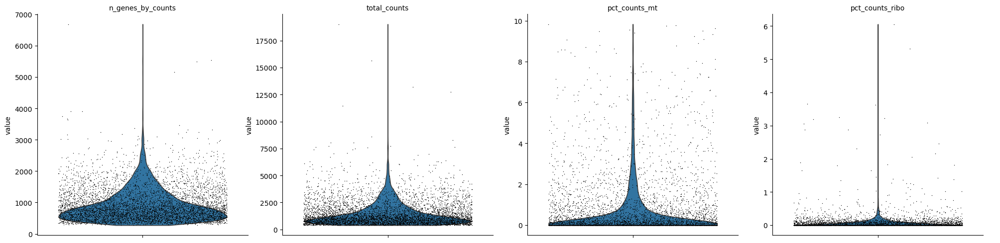

In [75]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo'], 
             jitter=0.4, multi_panel=True)#小提琴图展示各细胞的基因数、总计数、线粒体基因百分比和核糖体基因百分比

In [76]:
import numpy as np#NumPy的底层是用C语言写的，处理大规模矩阵的速度比Python原生列表快10到100倍。

In [ ]:
upper_lim = np.quantile(adata.obs.n_genes_by_counts.values, .98)#基因数的98%位数作为上限
upper_lim#查看98%位数的值，并过滤掉高于该值的细胞

2323.699999999996

In [80]:
adata = adata[adata.obs.n_genes_by_counts < upper_lim]
adata.obs

,doublet,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo
CCTCAACCATACAGGG-1_1,False,2276,5434.0,38.0,0.699301,0.0,0.000000
ACAAAGATCCACAGGC-1_1,False,2310,5504.0,1.0,0.018169,1.0,0.018169
ATACTTCCAAGGTCTT-1_1,False,2122,5252.0,1.0,0.019040,4.0,0.076161
CAGGGCTGTGCACAAG-1_1,False,2323,5187.0,4.0,0.077116,1.0,0.019279
GGGTCACTCTATTCGT-1_1,False,2286,5056.0,0.0,0.000000,1.0,0.019778
...,...,...,...,...,...,...,...
CGCCATTGTTTGCCGG-1_1,False,355,410.0,3.0,0.731707,0.0,0.000000
CACTGGGGTCTACGTA-1_1,False,346,403.0,0.0,0.000000,0.0,0.000000
CATACTTGTAGAGGAA-1_1,False,360,410.0,2.0,0.487805,0.0,0.000000
TTTGGTTTCCACGGAC-1_1,False,299,405.0,0.0,0.000000,2.0,0.493827


In [ ]:
adata = adata[adata.obs.pct_counts_mt < 20]#去除线粒体基因百分比大于20%的细胞
#如果一个细胞的线粒体占比高达20%以上，通常说明该细胞已经丢失了绝大部分细胞质 RNA。

In [ ]:
adata = adata[adata.obs.pct_counts_ribo < 2]#去除核糖体基因百分比大于2%的细胞
#通过小提琴图可以看到，大部分细胞的核糖体基因百分比都很低，只有极少数细胞的该百分比较高。

In [83]:
adata

View of AnnData object with n_obs × n_vars = 5517 × 24153
    obs: 'doublet', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells'

至此，数据预处理已经完全结束，去除了线粒体基因百分比大于20%、核糖体基因百分比大于2%、基因数大于98%位数、少于200个基因的细胞以及双细胞。

# Normalization

归一化的目的是消除由于实验技术误差导致的“假差异”，让不同细胞之间的基因表达量具有可比性

In [ ]:
adata.X.sum(axis = 1)
#adata.X：这是存储基因表达数据的核心矩阵。它的每一行代表一个细胞，每一列代表一个基因。
#axis=0 代表纵向（按列求和，即计算每个基因在所有细胞中的总和）。
#axis=1 代表横向（按行求和）。因为每一行是一个细胞，所以这步操作是在计算每个细胞内所有基因表达量的总和。
#目的：为了检查测序深度

array([5433., 5502., 5250., ...,  410.,  405.,  410.], dtype=float32)

In [85]:
sc.pp.normalize_total(adata, target_sum=1e4) #normalize every cell to 10,000 UMI
#1e4：不管每个细胞原来测到了多少个 UMI，现在全部等比例缩放，使得每个细胞的总 UMI 数都等于10000。（1e4是单细胞领域最常用的缩放因子）

/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:207: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [86]:
adata.X.sum(axis = 1)

array([10000., 10000., 10000., ..., 10000., 10000., 10000.], dtype=float32)

In [88]:
sc.pp.log1p(adata) #change to log counts，进行对数转换。
#基因表达量的差异可能高达几个数量级（有的基因是 1，有的是 500）。取对数后，这种巨大的差距会被缩小。
#防止高表达基因在后续的 PCA 降维中产生“霸权”，掩盖掉低表达但有生物学意义的基因。

In [89]:
adata.X.sum(axis = 1)

array([3285.3794, 3163.8867, 2858.16  , ..., 1191.2706, 1022.7511,
       1162.8785], dtype=float32)

In [90]:
adata.raw = adata#将当前的表达矩阵存储在adata.raw中，供后续使用

后续的降维（PCA）或聚类分析中想尝试不同的参数，只需从adata.raw开始，而不需要每次都重新运行耗时的双细胞预测和复杂的质控计算。

# Clustering

In [ ]:
sc.pp.highly_variable_genes(adata, n_top_genes = 2000)#再次选择2000个高变基因，供后续分析使用
#注意，此时选择的是adata，而不是adata.raw，是因为adata.raw作为原始数据存储，不会被后续的处理步骤修改

选择2000高变基因用于后续PCA降维

In [92]:
adata.var

,mt,ribo,n_cells_by_counts,mean_counts,pct_dropout_by_counts,total_counts,n_cells,highly_variable,means,dispersions,dispersions_norm
AL627309.1,False,False,6,0.001063,99.893730,6.0,6,True,0.011083,2.764097,1.255423
AL627309.5,False,False,25,0.004428,99.557209,25.0,25,False,0.028456,2.317463,-0.102484
AL627309.4,False,False,3,0.000531,99.946865,3.0,3,False,0.002518,1.702937,-1.970831
LINC01409,False,False,241,0.046405,95.731491,262.0,241,False,0.270621,2.325896,-0.076843
FAM87B,False,False,6,0.001063,99.893730,6.0,6,False,0.007217,1.947427,-1.227507
...,...,...,...,...,...,...,...,...,...,...,...
AL354822.1,False,False,116,0.020900,97.945448,118.0,116,False,0.153921,2.421212,0.212947
AL592183.1,False,False,854,0.179950,84.874247,1016.0,854,False,0.868413,2.518633,-0.376641
AC240274.1,False,False,143,0.026213,97.467233,148.0,143,False,0.149349,2.305869,-0.137732
AC007325.4,False,False,4,0.000708,99.929153,4.0,4,False,0.003026,1.579847,-2.345062


此时的adata.var在原有的基础上增加了highly_variable、means、dispersions、dispersions_norm四行。

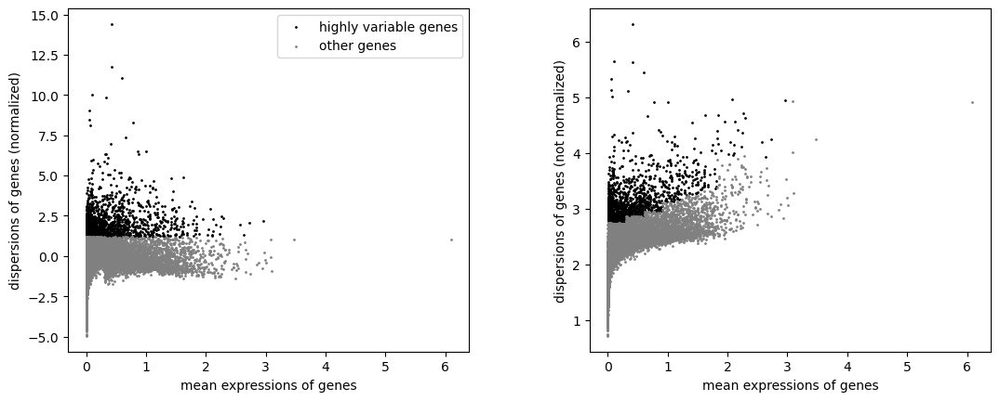

In [93]:
sc.pl.highly_variable_genes(adata)

In [ ]:
adata = adata[:, adata.var.highly_variable]
#adata[行, 列]，在行（细胞）的位置使用冒号，表示保留所有细胞。
#在列（基因）的位置使用adata.var.highly_variable这个布尔数组，表示只保留被标记为高变基因的那些列。
#.被称为属性访问操作符（Attribute Access Operator），A.B时，它的含义是：“去 A 里面，找到它的 B”。

In [ ]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt', 'pct_counts_ribo'])#消除技术性噪音
#通过回归分析的方法，把那些由非生物因素（技术误差）导致的基因表达波动给“抹掉”，从而让后续的分群更加真实地反映细胞本身的生物学差异。

/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:668: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


In [ ]:
sc.pp.scale(adata, max_value=10)#max_value=10设置截断阈值。如果某个基因在标准化后的数值超过了 10，会被强制设为 10。
#这样做是为了防止极端值对后续分析（如 PCA）产生过大的影响。
#这一步是PCA降维的前置步骤。

数据标准化是进行PCA降维的前提

In [ ]:
sc.tl.pca(adata, svd_solver='arpack')#指定使用arpack方法进行PCA降维
#运行完这行代码，adata对象会多出以下内容：
#adata.obsm['X_pca']：这是一个矩阵，行数是细胞数，列数默认是 50。它存储了每个细胞在 50 个主成分上的坐标。
#adata.varm['PCs']: 存储了每个基因对每个主成分的贡献度（Loadings）。
#adata.uns['pca']: 存储了方差解释率等统计信息。

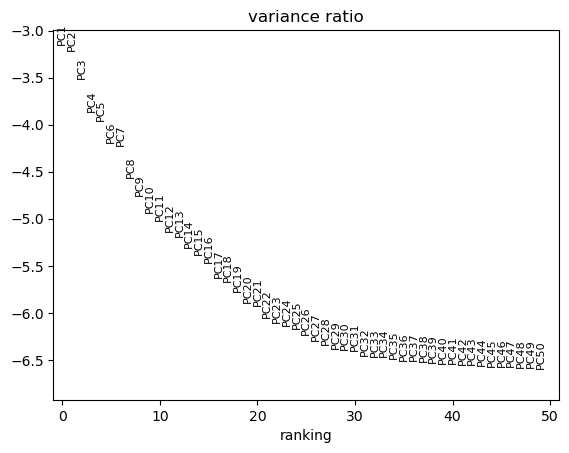

In [ ]:
sc.pl.pca_variance_ratio(adata, log=True, n_pcs = 50)
#寻找“肘点”（Elbow Point），即主成分数量与方差解释率之间的拐点，该图为30个主成分。

In [99]:
sc.pp.neighbors(adata, n_pcs = 30)
#构建细胞之间的邻面关系网络（Neighborhood Graph）。
#理解为：根据这 30 个核心特征，帮每一个细胞找到它在基因表达上最像的‘邻居’。

基于PCA结果计算邻域图，帮助细胞找到“邻居”

In [ ]:
adata
#出现obsp: 'distances', 'connectivities'

AnnData object with n_obs × n_vars = 5517 × 2000
    obs: 'doublet', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'mt', 'ribo', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'log1p', 'hvg', 'pca', 'neighbors'
    obsm: 'X_pca'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [ ]:
adata.obsp['distances']
#5517 x 5517:这是一个方阵。行和列都代表你的细胞。
#5517代表你经过之前的重重过滤（去双细胞、去死细胞、去低基因细胞）后，最终进入核心分析阶段的存活细胞总数。

#sparse matrix (稀疏矩阵):这意味着矩阵中绝大多数位置都是 0。
#因为在计算邻居时，我们只让每个细胞找距离最近的 15 个邻居（默认值）。对于一个细胞来说，剩下的 5501 个细胞都太远了，距离被记为 0。这种存储方式极大地节省了内存。

#77238 stored elements:这代表整个矩阵中只有 77,238 个位置是有数值的（即细胞之间存在“邻居关系”）。
#计算一下：77238/5517这正好对应了每个细胞大约有 14-15 个邻居。

<5517x5517 sparse matrix of type '<class 'numpy.float64'>'
	with 77238 stored elements in Compressed Sparse Row format>

In [ ]:
adata.obsp['connectivities']
#distances（距离矩阵）：存储的是物理距离（欧几里得距离）。数值越大，表示两个细胞越不像。
#connectivities（连通性矩阵）：存储的是权重。数值通常在0到1之间。1 代表两个细胞极其相似；0 代表它们之间没有直接联系。
#113408 stored elements:表示在连通性矩阵中，有113,408个位置是有数值的（即细胞之间存在“连通关系”）。

<5517x5517 sparse matrix of type '<class 'numpy.float32'>'
	with 113408 stored elements in Compressed Sparse Row format>

最终聚类（Leiden 或 Louvain 算法）主要看的是 connectivities（连通性矩阵）。

In [ ]:
sc.tl.umap(adata)#为每个细胞计算出在二维平面上的 X, Y 坐标。

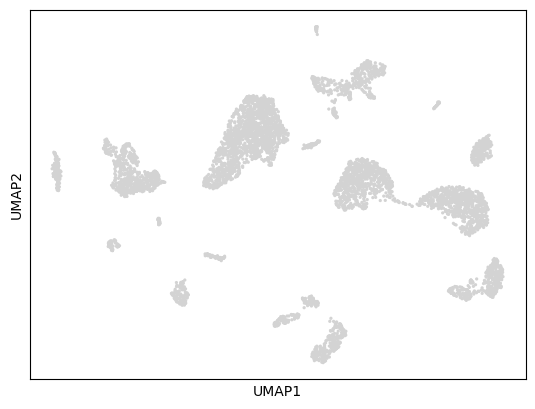

In [ ]:
sc.pl.umap(adata)#读取上一步算好的坐标，把 5,517 个细胞画在屏幕上。

In [ ]:
import leidenalg
print("安装成功！")
#在终端进行安装leidenalg

安装成功！


In [ ]:
sc.tl.leiden(adata, resolution = 0.5)
#运行 Leiden 聚类算法，将基因表达模式相似的细胞归为一类（Cluster）。
#0.5 是一个中等、常用的初始值。过高会导致分群细碎，过低会导致分群过于粗糙。

/var/folders/l2/f03q12kn4r9bx_07m87jc8wm0000gn/T/ipykernel_45060/3246266323.py:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution = 0.5)


leiden算法的作用是将邻域图划分为不同的簇。

In [ ]:
adata.obs
#此时多了一列 'leiden'，表示每个细胞所属的群集编号

,doublet,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,leiden
CCTCAACCATACAGGG-1_1,False,2276,5434.0,38.0,0.699301,0.0,0.000000,11
ACAAAGATCCACAGGC-1_1,False,2310,5504.0,1.0,0.018169,1.0,0.018169,2
ATACTTCCAAGGTCTT-1_1,False,2122,5252.0,1.0,0.019040,4.0,0.076161,2
CAGGGCTGTGCACAAG-1_1,False,2323,5187.0,4.0,0.077116,1.0,0.019279,2
GGGTCACTCTATTCGT-1_1,False,2286,5056.0,0.0,0.000000,1.0,0.019778,2
...,...,...,...,...,...,...,...,...
CGCCATTGTTTGCCGG-1_1,False,355,410.0,3.0,0.731707,0.0,0.000000,7
CACTGGGGTCTACGTA-1_1,False,346,403.0,0.0,0.000000,0.0,0.000000,1
CATACTTGTAGAGGAA-1_1,False,360,410.0,2.0,0.487805,0.0,0.000000,0
TTTGGTTTCCACGGAC-1_1,False,299,405.0,0.0,0.000000,2.0,0.493827,5


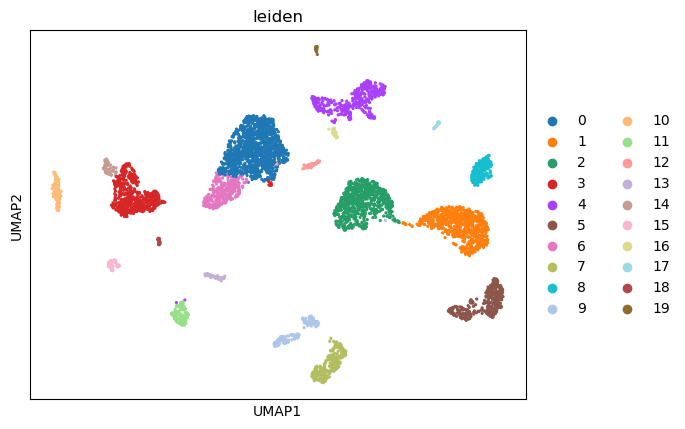

In [108]:
sc.pl.umap(adata, color=['leiden'])#根据不同的群集编号，为细胞上色，并重新绘制 UMAP 图。

到此为止已经完成了第一个样本的聚类分群，多个样本接下来就要进行整合。

# Integration

In [125]:
def pp(csv_path):
    adata = sc.read_csv(csv_path).T
    sc.pp.filter_genes(adata, min_cells = 10)
    sc.pp.highly_variable_genes(adata, n_top_genes = 2000, subset = True, flavor = 'seurat_v3')
    scvi.model.SCVI.setup_anndata(adata)
    vae = scvi.model.SCVI(adata)
    vae.train()
    solo = scvi.external.SOLO.from_scvi_model(vae)
    solo.train()
    df = solo.predict()
    df['prediction'] = solo.predict(soft = False)
    df.index = df.index.map(lambda x: x[:-2])
    df['dif'] = df.doublet - df.singlet
    doublets = df[(df.prediction == 'doublet') & (df.dif > 1)]
    adata = sc.read_csv(csv_path).T

    #【核心修改处】：针对我的文件名 GSM5226580_C57ctr_raw_counts.csv.gz
    file_name = csv_path.split('/')[-1]#csv_path.split('/')[-1] 先拿到文件名：'GSM5226580_C57ctr_raw_counts.csv.gz'
    adata.obs['Sample'] = file_name.split('_')[1]#.split('_')[1] 拿到：'C57ctr'
    
    adata.obs['doublet'] = adata.obs.index.isin(doublets.index)
    adata = adata[~adata.obs.doublet]
    
    sc.pp.filter_cells(adata, min_genes=200) #get rid of cells with fewer than 200 genes
    #sc.pp.filter_genes(adata, min_cells=3) #get rid of genes that are found in fewer than 3 cells
    adata.var['mt'] = adata.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
    adata.var['ribo'] = adata.var_names.isin(ribo_genes[0].values)
    sc.pp.calculate_qc_metrics(adata, qc_vars=['mt', 'ribo'], percent_top=None, log1p=False, inplace=True)
    upper_lim = np.quantile(adata.obs.n_genes_by_counts.values, .98)
    adata = adata[adata.obs.n_genes_by_counts < upper_lim]
    adata = adata[adata.obs.pct_counts_mt < 20]
    adata = adata[adata.obs.pct_counts_ribo < 2]

    return adata

    

In [126]:
import os
data_dir = 'GSE171524_RAW/' # 确保末尾有斜杠
out = []

In [127]:
for file in os.listdir(data_dir):
    if file.endswith('.csv.gz'):
        # 确保路径拼接正确
        full_path = os.path.join(data_dir, file) 
        print(f"正在处理: {full_path}") # 添加打印信息，这样你就能看到进度
        out.append(pp(full_path))

正在处理: GSE171524_RAW/GSM5226580_C57ctr_raw_counts.csv.gz


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|██████████| 400/400 [02:41<00:00,  2.49it/s, v_num=1, train_loss_step=309, train_loss_epoch=289]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [02:41<00:00,  2.48it/s, v_num=1, train_loss_step=309, train_loss_epoch=289]
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 159/400:  40%|███▉      | 159/400 [00:20<00:31,  7.69it/s, v_num=1, train_loss_step=0.381, train_loss_epoch=0.256]  
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.256. Signaling Trainer to stop.


/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adat

正在处理: GSE171524_RAW/GSM5226583_L04cov_raw_counts.csv.gz


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|██████████| 400/400 [02:06<00:00,  2.65it/s, v_num=1, train_loss_step=227, train_loss_epoch=260]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [02:06<00:00,  3.15it/s, v_num=1, train_loss_step=227, train_loss_epoch=260]
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 363/400:  91%|█████████ | 363/400 [00:36<00:03, 10.06it/s, v_num=1, train_loss_step=0.353, train_loss_epoch=0.277]
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.257. Signaling Trainer to stop.


/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adat

正在处理: GSE171524_RAW/GSM5226579_C56ctr_raw_counts.csv.gz


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|██████████| 400/400 [02:25<00:00,  2.88it/s, v_num=1, train_loss_step=321, train_loss_epoch=324]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [02:25<00:00,  2.75it/s, v_num=1, train_loss_step=321, train_loss_epoch=324]
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 196/400:  49%|████▉     | 196/400 [00:21<00:21,  9.30it/s, v_num=1, train_loss_step=0.286, train_loss_epoch=0.264]
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.263. Signaling Trainer to stop.


/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adat

正在处理: GSE171524_RAW/GSM5226595_L16cov_raw_counts.csv.gz


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|██████████| 400/400 [01:03<00:00,  6.45it/s, v_num=1, train_loss_step=404, train_loss_epoch=376]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [01:03<00:00,  6.31it/s, v_num=1, train_loss_step=404, train_loss_epoch=376]
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 218/400:  55%|█████▍    | 218/400 [00:10<00:09, 19.83it/s, v_num=1, train_loss_step=0.446, train_loss_epoch=0.309]
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.320. Signaling Trainer to stop.


/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adat

正在处理: GSE171524_RAW/GSM5226599_L21cov_raw_counts.csv.gz


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|██████████| 400/400 [01:54<00:00,  3.52it/s, v_num=1, train_loss_step=272, train_loss_epoch=319]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [01:54<00:00,  3.51it/s, v_num=1, train_loss_step=272, train_loss_epoch=319]
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 290/400:  72%|███████▎  | 290/400 [00:26<00:09, 11.07it/s, v_num=1, train_loss_step=0.247, train_loss_epoch=0.292]
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.287. Signaling Trainer to stop.


/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adat

正在处理: GSE171524_RAW/GSM5226577_C54ctr_raw_counts.csv.gz


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|██████████| 400/400 [02:27<00:00,  2.79it/s, v_num=1, train_loss_step=295, train_loss_epoch=308]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [02:27<00:00,  2.71it/s, v_num=1, train_loss_step=295, train_loss_epoch=308]
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 151/400:  38%|███▊      | 151/400 [00:17<00:28,  8.88it/s, v_num=1, train_loss_step=0.247, train_loss_epoch=0.239]
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.229. Signaling Trainer to stop.


/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adat

正在处理: GSE171524_RAW/GSM5226598_L19cov_raw_counts.csv.gz


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|██████████| 400/400 [01:26<00:00,  4.88it/s, v_num=1, train_loss_step=446, train_loss_epoch=414]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [01:26<00:00,  4.63it/s, v_num=1, train_loss_step=446, train_loss_epoch=414]
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 220/400:  55%|█████▌    | 220/400 [00:14<00:11, 15.02it/s, v_num=1, train_loss_step=0.352, train_loss_epoch=0.339]
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.360. Signaling Trainer to stop.


/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adat

正在处理: GSE171524_RAW/GSM5226589_L09cov_raw_counts.csv.gz


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|██████████| 400/400 [01:58<00:00,  3.25it/s, v_num=1, train_loss_step=393, train_loss_epoch=337]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [01:58<00:00,  3.38it/s, v_num=1, train_loss_step=393, train_loss_epoch=337]
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 224/400:  56%|█████▌    | 224/400 [00:21<00:17, 10.22it/s, v_num=1, train_loss_step=0.677, train_loss_epoch=0.251] 
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.237. Signaling Trainer to stop.


/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adat

正在处理: GSE171524_RAW/GSM5226584_L04covaddon_raw_counts.csv.gz


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|██████████| 400/400 [02:32<00:00,  2.61it/s, v_num=1, train_loss_step=460, train_loss_epoch=325]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [02:32<00:00,  2.62it/s, v_num=1, train_loss_step=460, train_loss_epoch=325]
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 218/400:  55%|█████▍    | 218/400 [00:26<00:21,  8.38it/s, v_num=1, train_loss_step=0.203, train_loss_epoch=0.281]
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.285. Signaling Trainer to stop.


/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adat

正在处理: GSE171524_RAW/GSM5226588_L08cov_raw_counts.csv.gz


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|██████████| 400/400 [02:21<00:00,  2.79it/s, v_num=1, train_loss_step=365, train_loss_epoch=340]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [02:21<00:00,  2.84it/s, v_num=1, train_loss_step=365, train_loss_epoch=340]
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 306/400:  76%|███████▋  | 306/400 [00:33<00:10,  9.18it/s, v_num=1, train_loss_step=0.275, train_loss_epoch=0.293]
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.282. Signaling Trainer to stop.


/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adat

正在处理: GSE171524_RAW/GSM5226575_C52ctr_raw_counts.csv.gz


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|██████████| 400/400 [02:28<00:00,  2.75it/s, v_num=1, train_loss_step=403, train_loss_epoch=395]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [02:28<00:00,  2.70it/s, v_num=1, train_loss_step=403, train_loss_epoch=395]
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 190/400:  48%|████▊     | 190/400 [00:22<00:24,  8.45it/s, v_num=1, train_loss_step=0.588, train_loss_epoch=0.299]
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.306. Signaling Trainer to stop.


/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adat

正在处理: GSE171524_RAW/GSM5226591_L11cov_raw_counts.csv.gz


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|██████████| 400/400 [01:49<00:00,  3.71it/s, v_num=1, train_loss_step=302, train_loss_epoch=361]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [01:49<00:00,  3.66it/s, v_num=1, train_loss_step=302, train_loss_epoch=361]
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 187/400:  47%|████▋     | 187/400 [00:16<00:18, 11.66it/s, v_num=1, train_loss_step=0.248, train_loss_epoch=0.346]
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.358. Signaling Trainer to stop.


/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adat

正在处理: GSE171524_RAW/GSM5226576_C53ctr_raw_counts.csv.gz


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|██████████| 400/400 [03:49<00:00,  1.79it/s, v_num=1, train_loss_step=588, train_loss_epoch=334]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [03:49<00:00,  1.74it/s, v_num=1, train_loss_step=588, train_loss_epoch=334]
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 217/400:  54%|█████▍    | 217/400 [00:39<00:32,  5.55it/s, v_num=1, train_loss_step=0.184, train_loss_epoch=0.306]
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.316. Signaling Trainer to stop.


/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adat

正在处理: GSE171524_RAW/GSM5226590_L10cov_raw_counts.csv.gz


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|██████████| 400/400 [00:49<00:00,  8.09it/s, v_num=1, train_loss_step=320, train_loss_epoch=313]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [00:49<00:00,  8.00it/s, v_num=1, train_loss_step=320, train_loss_epoch=313]
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 376/400:  94%|█████████▍| 376/400 [00:15<00:00, 24.18it/s, v_num=1, train_loss_step=0.224, train_loss_epoch=0.261]
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.250. Signaling Trainer to stop.


/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adat

正在处理: GSE171524_RAW/GSM5226585_L05cov_raw_counts.csv.gz


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|██████████| 400/400 [01:40<00:00,  4.16it/s, v_num=1, train_loss_step=305, train_loss_epoch=349]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [01:40<00:00,  3.98it/s, v_num=1, train_loss_step=305, train_loss_epoch=349]
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 223/400:  56%|█████▌    | 223/400 [00:17<00:14, 12.51it/s, v_num=1, train_loss_step=0.253, train_loss_epoch=0.324]
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.338. Signaling Trainer to stop.


/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adat

正在处理: GSE171524_RAW/GSM5226594_L15cov_raw_counts.csv.gz


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|██████████| 400/400 [02:06<00:00,  3.16it/s, v_num=1, train_loss_step=338, train_loss_epoch=353]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [02:06<00:00,  3.16it/s, v_num=1, train_loss_step=338, train_loss_epoch=353]
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 233/400:  58%|█████▊    | 233/400 [00:24<00:17,  9.48it/s, v_num=1, train_loss_step=0.22, train_loss_epoch=0.289] 
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.280. Signaling Trainer to stop.


/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adat

正在处理: GSE171524_RAW/GSM5226597_L18cov_raw_counts.csv.gz


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|██████████| 400/400 [01:29<00:00,  4.56it/s, v_num=1, train_loss_step=311, train_loss_epoch=306]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [01:29<00:00,  4.48it/s, v_num=1, train_loss_step=311, train_loss_epoch=306]
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 254/400:  64%|██████▎   | 254/400 [00:18<00:10, 13.97it/s, v_num=1, train_loss_step=0.343, train_loss_epoch=0.198] 
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.194. Signaling Trainer to stop.


/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adat

正在处理: GSE171524_RAW/GSM5226578_C55ctr_raw_counts.csv.gz


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|██████████| 400/400 [03:01<00:00,  2.23it/s, v_num=1, train_loss_step=310, train_loss_epoch=306]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [03:01<00:00,  2.21it/s, v_num=1, train_loss_step=310, train_loss_epoch=306]
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 144/400:  36%|███▌      | 144/400 [00:20<00:35,  7.14it/s, v_num=1, train_loss_step=0.174, train_loss_epoch=0.229] 
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.248. Signaling Trainer to stop.


/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adat

正在处理: GSE171524_RAW/GSM5226596_L17cov_raw_counts.csv.gz


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|██████████| 400/400 [02:28<00:00,  2.74it/s, v_num=1, train_loss_step=342, train_loss_epoch=341]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [02:28<00:00,  2.70it/s, v_num=1, train_loss_step=342, train_loss_epoch=341]
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 257/400:  64%|██████▍   | 257/400 [00:30<00:17,  8.38it/s, v_num=1, train_loss_step=0.935, train_loss_epoch=0.261] 
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.243. Signaling Trainer to stop.


/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adat

正在处理: GSE171524_RAW/GSM5226592_L12cov_raw_counts.csv.gz


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|██████████| 400/400 [02:03<00:00,  3.28it/s, v_num=1, train_loss_step=347, train_loss_epoch=319]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [02:03<00:00,  3.24it/s, v_num=1, train_loss_step=347, train_loss_epoch=319]
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 245/400:  61%|██████▏   | 245/400 [00:23<00:14, 10.36it/s, v_num=1, train_loss_step=0.315, train_loss_epoch=0.315]
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.317. Signaling Trainer to stop.


/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adat

正在处理: GSE171524_RAW/GSM5226587_L07cov_raw_counts.csv.gz


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|██████████| 400/400 [02:38<00:00,  2.59it/s, v_num=1, train_loss_step=366, train_loss_epoch=341]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [02:38<00:00,  2.53it/s, v_num=1, train_loss_step=366, train_loss_epoch=341]
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 272/400:  68%|██████▊   | 272/400 [00:34<00:16,  7.81it/s, v_num=1, train_loss_step=0.241, train_loss_epoch=0.357] 
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.341. Signaling Trainer to stop.


/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adat

正在处理: GSE171524_RAW/GSM5226582_L03cov_raw_counts.csv.gz


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|██████████| 400/400 [02:39<00:00,  2.52it/s, v_num=1, train_loss_step=474, train_loss_epoch=474]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [02:39<00:00,  2.50it/s, v_num=1, train_loss_step=474, train_loss_epoch=474]
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 159/400:  40%|███▉      | 159/400 [00:20<00:30,  7.83it/s, v_num=1, train_loss_step=0.402, train_loss_epoch=0.35] 
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.358. Signaling Trainer to stop.


/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adat

正在处理: GSE171524_RAW/GSM5226586_L06cov_raw_counts.csv.gz


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|██████████| 400/400 [03:59<00:00,  1.66it/s, v_num=1, train_loss_step=385, train_loss_epoch=363]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [03:59<00:00,  1.67it/s, v_num=1, train_loss_step=385, train_loss_epoch=363]
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 156/400:  39%|███▉      | 156/400 [00:29<00:46,  5.26it/s, v_num=1, train_loss_step=0.275, train_loss_epoch=0.301]
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.291. Signaling Trainer to stop.


/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adat

正在处理: GSE171524_RAW/GSM5226593_L13cov_raw_counts.csv.gz


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|██████████| 400/400 [02:31<00:00,  2.68it/s, v_num=1, train_loss_step=406, train_loss_epoch=370]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [02:31<00:00,  2.64it/s, v_num=1, train_loss_step=406, train_loss_epoch=370]
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 150/400:  38%|███▊      | 150/400 [00:18<00:30,  8.31it/s, v_num=1, train_loss_step=0.312, train_loss_epoch=0.31] 
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.298. Signaling Trainer to stop.


/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adat

正在处理: GSE171524_RAW/GSM5226600_L22cov_raw_counts.csv.gz


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|██████████| 400/400 [03:45<00:00,  1.90it/s, v_num=1, train_loss_step=365, train_loss_epoch=340]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [03:45<00:00,  1.77it/s, v_num=1, train_loss_step=365, train_loss_epoch=340]
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 118/400:  30%|██▉       | 118/400 [00:20<00:50,  5.63it/s, v_num=1, train_loss_step=0.469, train_loss_epoch=0.312]
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.324. Signaling Trainer to stop.


/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adat

正在处理: GSE171524_RAW/GSM5226574_C51ctr_raw_counts.csv.gz


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|██████████| 400/400 [03:04<00:00,  2.17it/s, v_num=1, train_loss_step=327, train_loss_epoch=322]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [03:04<00:00,  2.17it/s, v_num=1, train_loss_step=327, train_loss_epoch=322]
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 164/400:  41%|████      | 164/400 [00:25<00:36,  6.38it/s, v_num=1, train_loss_step=0.452, train_loss_epoch=0.292]
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.300. Signaling Trainer to stop.


/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adat

正在处理: GSE171524_RAW/GSM5226581_L01cov_raw_counts.csv.gz


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|██████████| 400/400 [01:35<00:00,  4.19it/s, v_num=1, train_loss_step=354, train_loss_epoch=333]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [01:35<00:00,  4.17it/s, v_num=1, train_loss_step=354, train_loss_epoch=333]
INFO     Creating doublets, preparing SOLO model.                                                                  


GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 309/400:  77%|███████▋  | 309/400 [00:25<00:07, 12.34it/s, v_num=1, train_loss_step=0.392, train_loss_epoch=0.274]
Monitored metric validation_loss did not improve in the last 30 records. Best score: 0.259. Signaling Trainer to stop.


/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/torch/utils/_contextlib.py:120: UserWarning: Prior to scvi-tools 1.1.3, `SOLO.predict` with `soft=True` (the default option) returned logits instead of probabilities. This behavior has since been corrected to return probabiltiies. The previous behavior can be replicated by passing in `return_logits=True`.
  return func(*args, **kwargs)
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/preprocessing/_simple.py:167: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adat

In [128]:
adata = sc.concat(out)


In [ ]:
adata
#此时得到一个巨大的adata，包含了所有样本的单细胞数据，n_obs × n_vars = 108822 × 34546，表明共有108,822个细胞和34,546个基因。

AnnData object with n_obs × n_vars = 108822 × 34546
    obs: 'Sample', 'doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'

In [ ]:
sc.pp.filter_genes(adata, min_cells = 10)#保留至少在10个细胞中出现的基因

In [ ]:
adata.X#此时为密集矩阵，矩阵有大量0

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [132]:
from scipy.sparse import csr_matrix#csr_matrix忽略所有的0，保留非零数值

In [133]:
adata.X = csr_matrix(adata.X)#将密集矩阵转换为稀疏矩阵，节省内存

In [ ]:
adata.X#此时的adata为108822x29581的稀疏矩阵

<108822x29581 sparse matrix of type '<class 'numpy.float32'>'
	with 95760461 stored elements in Compressed Sparse Row format>

In [ ]:
adata.write_h5ad('combined.h5ad')
#检查 combined.h5ad 文件，大小为778.6 MB，说明成功保存。
#保存后即可退出VS Code

In [1]:
########################################################

In [2]:
import scanpy as sc
import scvi
import seaborn as sns
import numpy as np
import pandas as pd

In [ ]:
adata = sc.read_h5ad('combined.h5ad')#读取之前保存的combined.
adata

AnnData object with n_obs × n_vars = 108822 × 29581
    obs: 'Sample', 'doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'n_cells'

In [ ]:
adata.obs.groupby('Sample').count()#查看每个样本的细胞数目

/var/folders/l2/f03q12kn4r9bx_07m87jc8wm0000gn/T/ipykernel_54965/2340059915.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  adata.obs.groupby('Sample').count()


,doublet,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo
Sample,,,,,,,,
C51ctr,5960,5960,5960,5960,5960,5960,5960,5960
C52ctr,4415,4415,4415,4415,4415,4415,4415,4415
C53ctr,6928,6928,6928,6928,6928,6928,6928,6928
C54ctr,4284,4284,4284,4284,4284,4284,4284,4284
C55ctr,5565,5565,5565,5565,5565,5565,5565,5565
C56ctr,3904,3904,3904,3904,3904,3904,3904,3904
C57ctr,4687,4687,4687,4687,4687,4687,4687,4687
L01cov,2952,2952,2952,2952,2952,2952,2952,2952
L03cov,3953,3953,3953,3953,3953,3953,3953,3953


目前基因数目高达29581，接下来要去除低表达的基因

In [5]:
sc.pp.filter_genes(adata, min_cells = 100)#保留至少在100个细胞中出现的基因

In [ ]:
adata#保留后基因数从29581 --> 21306

AnnData object with n_obs × n_vars = 108822 × 21306
    obs: 'Sample', 'doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo'
    var: 'n_cells'

In [ ]:
adata.layers['counts'] = adata.X.copy()#将当前的表达矩阵存储在adata.layers['counts']中，供后续使用

In [8]:
sc.pp.normalize_total(adata, target_sum = 1e4) 
sc.pp.log1p(adata)
adata.raw = adata#将当前的表达矩阵存储在adata.raw中，供后续使用

In [9]:
adata.obs.head()

,Sample,doublet,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo
CTCCAACCATACACCA-1_7,C57ctr,False,1812,1812,3962.0,0.0,0.0,1.0,0.025240
TACTTACTCCATACTT-1_7,C57ctr,False,1845,1845,3643.0,0.0,0.0,1.0,0.027450
CCTCCAAGTGACATCT-1_7,C57ctr,False,1864,1864,3438.0,0.0,0.0,10.0,0.290867
GACTTCCAGACAACTA-1_7,C57ctr,False,1827,1827,3406.0,0.0,0.0,0.0,0.000000
CAACGATGTTGCTCAA-1_7,C57ctr,False,1845,1845,3405.0,0.0,0.0,0.0,0.000000


分析小样本单细胞测序数据，基因数应为细胞数的一半，即6000个细胞时，寻找高变基因就应该设置为3000，但对于大样本来说，该方法不适用。

In [ ]:
# sc.pp.highly_variable_genes(adata, n_top_genes=3000, subset = True, layer = 'counts',
#                            flavor = "seurat_v3", batch_key="Sample") #no batch_key if one sample

In [15]:
scvi.model.SCVI.setup_anndata(adata, layer = "counts",
                             categorical_covariate_keys=["Sample"],
                             continuous_covariate_keys=['pct_counts_mt', 'total_counts', 'pct_counts_ribo'])

In [16]:
model = scvi.model.SCVI(adata)

In [17]:
model.train() #may take a while without GPU
#M4pro芯片含有GPU但是目前PyTorch/SCVI还没完全适配好苹果的GPU硬件，所以还是采用CPU计算

GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 74/74: 100%|██████████| 74/74 [1:00:19<00:00, 48.98s/it, v_num=1, train_loss_step=2.34e+3, train_loss_epoch=2.95e+3]

`Trainer.fit` stopped: `max_epochs=74` reached.


Epoch 74/74: 100%|██████████| 74/74 [1:00:19<00:00, 48.92s/it, v_num=1, train_loss_step=2.34e+3, train_loss_epoch=2.95e+3]


In [ ]:
model.get_latent_representation().shape#潜在空间中的表示

(108822, 10)

In [20]:
adata.obsm['X_scVI'] = model.get_latent_representation()

In [21]:
adata.layers['scvi_normalized'] = model.get_normalized_expression(library_size = 1e4)
#标准化后的表达矩阵存储在adata.layers['scvi_normalized']中，供后续使用

In [27]:
adata.layers['scvi_normalized'].shape

(108822, 21306)

scvi_normalized 的shape是：(99,000 个细胞) x (20,000 个基因)。

X_scVI 的shape是：(99,000 个细胞) x (10 个隐变量)。

X_scVI 是用来“找关系”（聚类）的，而 scvi_normalized 是用来“看细节”（画基因表达图）的。

In [24]:
sc.pp.neighbors(adata, use_rep = 'X_scVI')#使用潜在空间表示聚类

Epoch 1/74:   0%|          | 0/74 [1:48:19<?, ?it/s]


In [ ]:
sc.tl.umap(adata)
sc.tl.leiden(adata, resolution = 0.5)#使用leiden算法进行聚类

/var/folders/l2/f03q12kn4r9bx_07m87jc8wm0000gn/T/ipykernel_54965/4004962361.py:2: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution = 0.5)


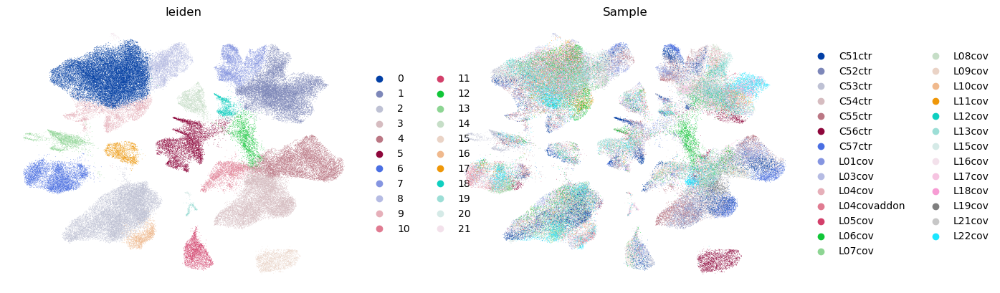

In [ ]:
sc.pl.umap(adata, color = ['leiden', 'Sample'], frameon = False)
#frameon = False，防止边框显示

sample图中有一群细胞仅来自于C56ctr，可能是由于该样本混入了独有的细胞。

In [ ]:
adata.write_h5ad('integrated.h5ad')
#把最新的adata保存为integrated.h5ad，这个文件包含了所有样本整合后的单细胞数据并且进行了聚类分群

# Find markers/ label cell types

In [ ]:
sc.tl.leiden(adata, resolution = 1)#提高分辨率再次聚类
#此时的聚类结果将覆盖之前的leiden结果，变为更精细的分群结果

In [30]:
sc.tl.rank_genes_groups(adata, 'leiden')#寻找每个群集的标志基因

/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:435: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "names"] = self.var_names[global_indices]
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:437: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, "scores"] = scores[global_indices]
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:440: PerformanceWarning:

In [32]:
#sc.pl.rank_genes_groups(adata, n_genes=20, sharey=False)
#为每一个细胞群（Cluster）画一张专属的基因评分图，展示排名最靠前的 20 个标志基因。
#sharey=False，禁止共享y轴，以便更好地比较不同群集的基因表达水平。
#若sharey=True，则所有子图y轴刻度一致。

In [36]:
#sc.get.rank_genes_groups_df(adata, None)
#group代表每个细胞群的编号
#score代表该基因在该群集中的评分

In [ ]:
markers = sc.get.rank_genes_groups_df(adata, None)
markers = markers[(markers.pvals_adj < 0.05) & (markers.logfoldchanges > .5)]#保留显著且上调的maker
markers

,group,names,scores,logfoldchanges,pvals,pvals_adj
0,0,CTSB,131.684341,4.475553,0.000000,0.000000
1,0,PSAP,117.179993,4.506627,0.000000,0.000000
2,0,SLC11A1,115.291382,4.341795,0.000000,0.000000
3,0,CTSD,112.362961,5.314970,0.000000,0.000000
4,0,LRMDA,108.401505,2.522985,0.000000,0.000000
...,...,...,...,...,...,...
618650,29,NDUFB11,2.143018,4.785225,0.036905,0.048274
618651,29,CASP7,2.141912,2.141030,0.036997,0.048389
618652,29,ATP6V1G1,2.136781,2.781245,0.037434,0.048957
618653,29,NRP2,2.130987,1.449189,0.037930,0.049598


首先使用sc.get.rank_genes_groups_df(adata, None)直接读取 adata.X 里的数值进行 T 检验或 Wilcoxon 检验，是为了检查聚类是否合理。

接着使用model.differential_expression(groupby = 'leiden')去除批次效应，最终确定聚类结果。



In [ ]:
markers_scvi = model.differential_expression(groupby = 'leiden')#使用scvi模型进行差异表达分析
markers_scvi
#再次去除批次效应是因为之前去除批次效应是为了更好地进行聚类分析，而差异表达分析则需要在去除批次效应的基础上，重新评估基因在不同细胞群之间的表达差异。

DE...: 100%|██████████| 30/30 [06:07<00:00, 12.24s/it]


,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2
ACP5,0.9894,0.0106,4.536244,0.000313,0.000020,0.0,0.25,7.920177,7.967040,4.344662,...,0.800868,0.035286,0.309736,0.021240,3.564678,0.194981,True,0 vs Rest,0,Rest
APOC1,0.9884,0.0116,4.445082,0.000151,0.000013,0.0,0.25,7.298745,7.337154,4.360123,...,0.414743,0.027198,0.187843,0.016880,1.828423,0.143227,True,0 vs Rest,0,Rest
TM4SF19,0.9876,0.0124,4.377580,0.000169,0.000007,0.0,0.25,5.266440,5.243848,2.968134,...,0.257022,0.006189,0.139860,0.005154,1.329049,0.042753,True,0 vs Rest,0,Rest
APOE,0.9868,0.0132,4.314250,0.001246,0.000106,0.0,0.25,6.768294,6.738102,4.468154,...,3.493501,0.195445,0.452286,0.049685,16.161240,1.110881,True,0 vs Rest,0,Rest
ASGR1,0.9866,0.0134,4.299009,0.000106,0.000008,0.0,0.25,5.543224,5.654213,3.094909,...,0.167080,0.011313,0.097149,0.008872,0.891479,0.068339,True,0 vs Rest,0,Rest
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MSL1,0.5740,0.4260,0.298190,0.000061,0.000059,0.0,0.25,0.124388,0.079341,0.502295,...,0.076923,0.073175,0.076923,0.068070,0.874012,0.554906,False,29 vs Rest,29,Rest
TM9SF4,0.5728,0.4272,0.293284,0.000062,0.000059,0.0,0.25,0.104583,0.109851,0.440275,...,0.038462,0.091802,0.038462,0.082587,0.271536,0.673438,False,29 vs Rest,29,Rest
RUFY1,0.5668,0.4332,0.268807,0.000074,0.000071,0.0,0.25,0.107127,0.083181,0.445951,...,0.038462,0.102485,0.038462,0.091579,0.304751,0.769442,False,29 vs Rest,29,Rest
DDX19A,0.5610,0.4390,0.245221,0.000026,0.000026,0.0,0.25,0.050807,0.029551,0.459349,...,0.019231,0.038081,0.019231,0.036085,0.036326,0.286221,False,29 vs Rest,29,Rest


In [ ]:
markers_scvi = markers_scvi[(markers_scvi['is_de_fdr_0.05']) & (markers_scvi.lfc_mean > .5)]#保留显著且上调的maker
markers_scvi
#is_de_fdr_0.05 列表示该基因在不同细胞群之间的表达差异是否显著（经过 FDR 校正后，p 值小于 0.05）。
#lfc_mean 列表示该基因在不同细胞群之间的平均对数倍数变化（log fold change）,0.5表示上调超过1.41倍。

,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2
ACP5,0.9894,0.0106,4.536244,0.000313,0.000020,0.0,0.25,7.920177,7.967040,4.344662,...,0.800868,0.035286,0.309736,0.021240,3.564678,0.194981,True,0 vs Rest,0,Rest
APOC1,0.9884,0.0116,4.445082,0.000151,0.000013,0.0,0.25,7.298745,7.337154,4.360123,...,0.414743,0.027198,0.187843,0.016880,1.828423,0.143227,True,0 vs Rest,0,Rest
TM4SF19,0.9876,0.0124,4.377580,0.000169,0.000007,0.0,0.25,5.266440,5.243848,2.968134,...,0.257022,0.006189,0.139860,0.005154,1.329049,0.042753,True,0 vs Rest,0,Rest
APOE,0.9868,0.0132,4.314250,0.001246,0.000106,0.0,0.25,6.768294,6.738102,4.468154,...,3.493501,0.195445,0.452286,0.049685,16.161240,1.110881,True,0 vs Rest,0,Rest
ASGR1,0.9866,0.0134,4.299009,0.000106,0.000008,0.0,0.25,5.543224,5.654213,3.094909,...,0.167080,0.011313,0.097149,0.008872,0.891479,0.068339,True,0 vs Rest,0,Rest
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HMGN1,0.9042,0.0958,2.244788,0.000118,0.000057,0.0,0.25,1.098038,1.076005,0.787738,...,0.038462,0.080429,0.038462,0.073329,0.487078,0.571107,True,29 vs Rest,29,Rest
PDE4A,0.9042,0.0958,2.244788,0.000072,0.000048,0.0,0.25,1.186621,1.236145,1.499143,...,0.115385,0.065700,0.115385,0.057378,1.210043,0.529344,True,29 vs Rest,29,Rest
AC244213.1,0.9042,0.0958,2.244788,0.000005,0.000004,0.0,0.25,1.252496,1.085098,1.942411,...,0.000000,0.004487,0.000000,0.004422,0.000000,0.036456,True,29 vs Rest,29,Rest
TM2D3,0.9042,0.0958,2.244788,0.000051,0.000027,0.0,0.25,1.044291,1.042586,0.670323,...,0.115385,0.036298,0.096154,0.034605,1.787749,0.271510,True,29 vs Rest,29,Rest


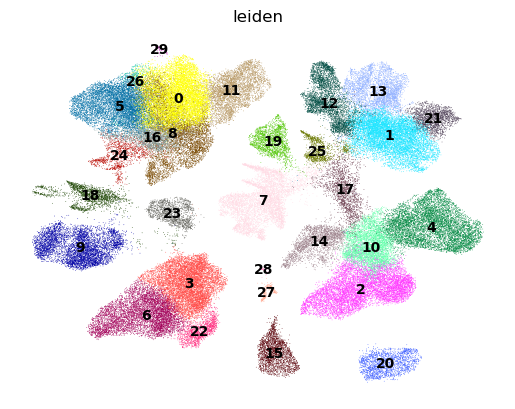

In [ ]:
sc.pl.umap(adata, color = ['leiden'], frameon = False, legend_loc = "on data")
#legend_loc = "on data"，将图例直接显示在细胞群上，方便识别不同群集的位置。

# Annotation

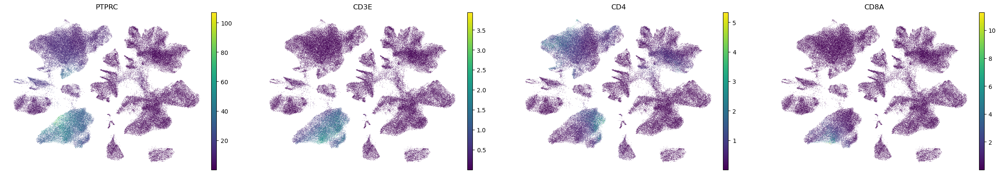

In [ ]:
sc.pl.umap(adata, color = ['PTPRC', 'CD3E','CD4','CD8A'], frameon = False, layer = 'scvi_normalized')
#PTPRC即CD45，标记出所有的免疫细胞
#CD3E代表T细胞，对应cluster3和cluster6
#CD4代表辅助T细胞，对应cluster3
#CD8A代表细胞毒性T细胞，对应cluster6

In [ ]:
markers[markers.names == 'CD4']#查看CD4基因在各细胞群中的差异表达情况

,group,names,scores,logfoldchanges,pvals,pvals_adj
2366,0,CD4,10.472452,0.814396,1.542314e-25,4.412588e-25
64386,3,CD4,16.642153,1.633124,3.539798e-61,1.458216e-60
106911,5,CD4,24.583420,2.315356,5.202711e-128,4.556061e-127
172140,8,CD4,7.543752,0.786365,5.265527e-14,1.309070e-13
236529,11,CD4,9.537548,1.041126,2.341722e-21,7.769033e-21
342369,16,CD4,4.749154,0.811460,2.182619e-06,4.249943e-06
470438,22,CD4,6.724007,1.311894,2.503639e-11,6.520295e-11
511955,24,CD4,6.605973,1.456626,5.889589e-11,2.139897e-10
554814,26,CD4,7.269205,2.113296,1.764612e-12,6.146284e-12
618261,29,CD4,3.065889,2.971078,3.466214e-03,4.737389e-03


scores：Scanpy 默认使用 t-test（t检验）或 Wilcoxon 秩和检验，这里的 Score 就是统计学上的 T-statistic 或 Z-score。

logfoldchanges：对数倍数变化，它计算的是某个基因在当前群（Group A）的平均表达量，与其余所有群（Rest）平均表达量的比值，然后取以2为底的对数。

In [44]:
markers[markers.names == 'CD8A']

,group,names,scores,logfoldchanges,pvals,pvals_adj
64966,3,CD8A,8.747936,1.778480,2.610604e-18,6.311304e-18
128112,6,CD8A,21.010515,4.905645,9.272586e-95,4.761671e-94
469825,22,CD8A,8.795861,3.159428,3.839855e-18,1.157989e-17


此时可以肯定cluster3为CD4+T细胞，而cluster6、22为CD8+T细胞

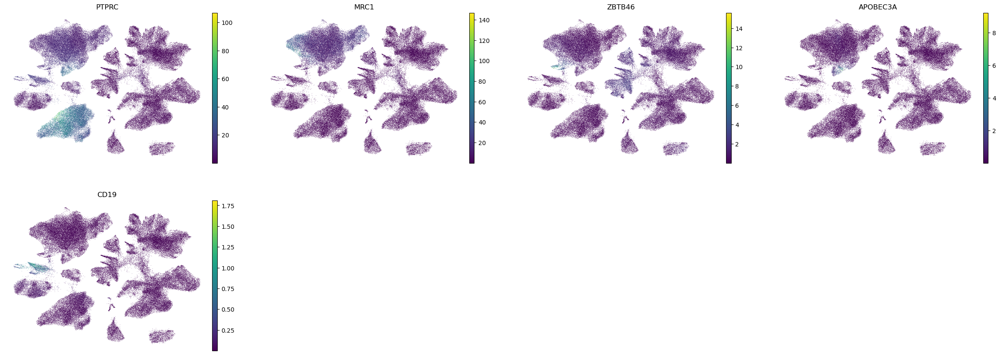

In [ ]:
sc.pl.umap(adata, color = ['PTPRC','MRC1','ZBTB46','APOBEC3A','CD19'], frameon = False, layer = 'scvi_normalized')
#MRC1标记巨噬细胞
#ZBTB46标记树突状细胞
#APOBEC3A标记单核细胞
#CD19标记B细胞

In [62]:
markers[markers.names == 'CD19']

,group,names,scores,logfoldchanges,pvals,pvals_adj
195174,9,CD19,4.416050,2.229443,1.024977e-05,1.776472e-05
383940,18,CD19,9.173655,6.400167,1.152578e-19,3.907834e-19


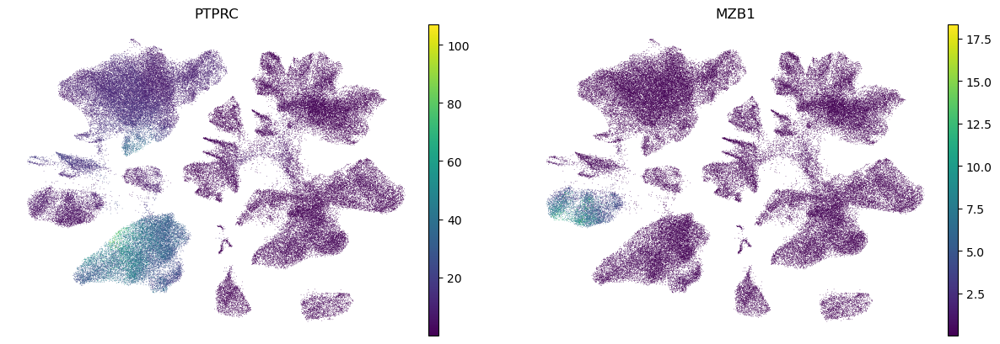

In [ ]:
sc.pl.umap(adata, color = ['PTPRC','MZB1'], frameon = False, layer = 'scvi_normalized')
#MZB1标记浆细胞，即终末分化的B细胞

In [ ]:
markers[markers.names == 'MZB1']
#结合UMAP图，可以看到MZB1主要在cluster9中高表达，说明cluster9是浆细胞群。

,group,names,scores,logfoldchanges,pvals,pvals_adj
191797,9,MZB1,56.254906,10.124139,0.0,0.0


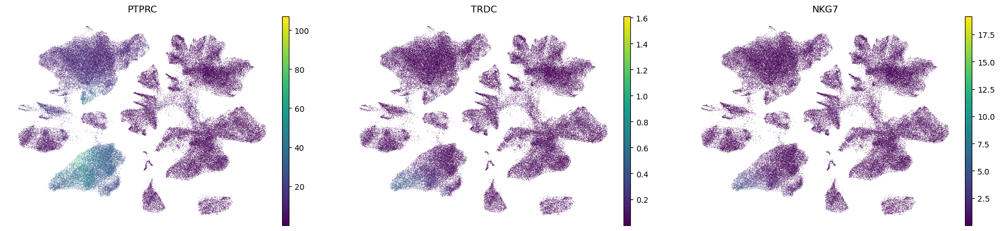

In [95]:
sc.pl.umap(adata, color = ['PTPRC','TRDC','NKG7'], frameon = False, layer = 'scvi_normalized')
#TRDC和NKG7都是自然杀伤T细胞（NKT细胞）的标志基因
#所以认为cluster22是Cycling T/NK细胞群

In [ ]:
markers[markers.names == 'NKG7']

,group,names,scores,logfoldchanges,pvals,pvals_adj
128021,6,NKG7,26.121975,5.883411,7.733357e-143,4.927240e-142
469332,22,NKG7,11.762814,3.746357,1.308880e-30,5.058407e-30


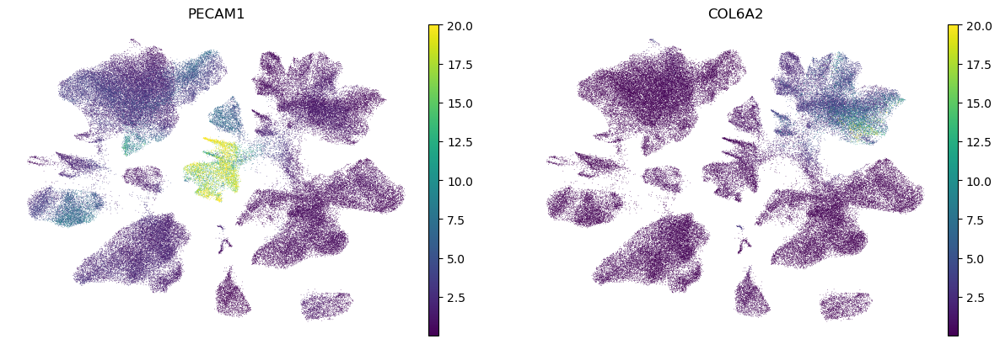

In [111]:
sc.pl.umap(adata, color = ['PECAM1','COL6A2'], frameon = False, layer = 'scvi_normalized',vmax=20)
#PECAM1标记内皮细胞
#COL6A2标记成纤维细胞

In [113]:
markers[markers.names == 'COL6A2']
#结合UMAP图，可以看到COL6A2主要在cluster1、12、13中高表达，说明这些群是成纤维细胞群。

,group,names,scores,logfoldchanges,pvals,pvals_adj
21367,1,COL6A2,69.128502,4.215737,0.000000e+00,0.000000e+00
255952,12,COL6A2,25.038702,2.207203,5.358716e-129,5.615977e-128
277089,13,COL6A2,35.602978,3.126383,3.357252e-238,8.202936e-237
362411,17,COL6A2,6.716256,0.934423,2.435755e-11,2.342943e-10
447579,21,COL6A2,25.369701,3.076418,5.958290e-122,6.792259e-121
532762,25,COL6A2,15.884664,2.556669,1.452474e-51,1.661106e-50


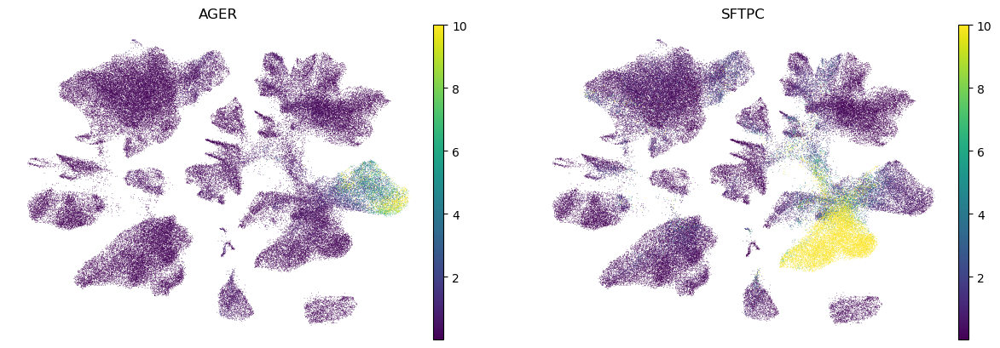

In [ ]:
sc.pl.umap(adata, color = ['AGER','SFTPC'], frameon = False, layer = 'scvi_normalized', vmax=10)
#AGER标记肺泡上皮I型细胞
#SFTPC标记肺泡上皮II型细胞
#如果图中基因的表达不明显，可以通过调整vmax参数来改善可视化效果

In [60]:
markers[markers.names == 'SFTPC']

,group,names,scores,logfoldchanges,pvals,pvals_adj
42644,2,SFTPC,99.809113,7.207602,0.000000e+00,0.000000e+00
213253,10,SFTPC,31.804665,2.899435,7.556040e-202,1.390233e-200
362301,17,SFTPC,9.297270,1.256442,3.710323e-20,5.795612e-19


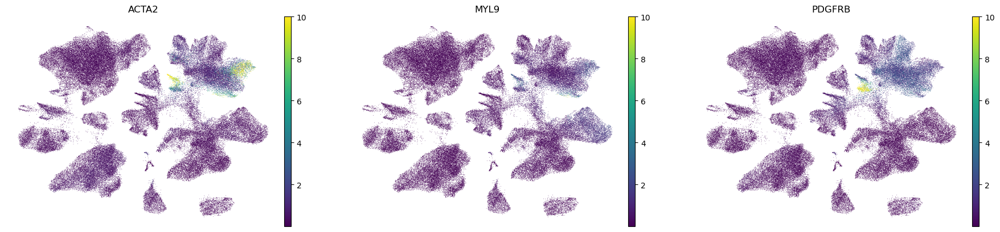

In [ ]:
sc.pl.umap(adata, color = ['ACTA2','MYL9','PDGFRB'], frameon = False, layer = 'scvi_normalized',vmax=10)
#ACTA2标记周细胞，周细胞通常和血管内皮细胞 (Endothelial cells) 以及 平滑肌细胞 (Smooth Muscle Cells) 关系非常紧密。
#MYL9标记平滑肌细胞
#PDGFRB标记周细胞，因为ACTA2在cluster21和cluster25中表达较高，用PDGFRB可以更准确地标记周细胞

In [66]:
markers[markers.names == 'ACTA2']
#虽然cluster21\25的ACTA2表达较高，但两群细胞并不相邻，所以不能简单地将它们归为同一细胞类型

,group,names,scores,logfoldchanges,pvals,pvals_adj
21791,1,ACTA2,28.436806,2.501678,1.158043e-170,1.304773e-169
256723,12,ACTA2,9.914518,1.288792,6.416404e-23,2.212818e-22
278924,13,ACTA2,6.090211,0.789590,1.241935e-09,3.708572e-09
447522,21,ACTA2,30.442032,4.857687,6.390535e-165,9.351425e-164
532701,25,ACTA2,20.893553,4.378299,1.696366e-82,3.097068e-81


In [ ]:
markers[markers.names == 'PDGFRB']
#PDGFRB在cluster25中表达较高，结合ACTA2和MYL9的表达情况，可以将cluster25标记为周细胞群

,group,names,scores,logfoldchanges,pvals,pvals_adj
21524,1,PDGFRB,42.814373,3.497599,0.000000e+00,0.000000e+00
256349,12,PDGFRB,14.262026,1.696954,4.271139e-45,2.206617e-44
277210,13,PDGFRB,25.877455,3.029486,1.511105e-135,2.221918e-134
362817,17,PDGFRB,3.759010,0.694669,1.755802e-04,6.581478e-04
447977,21,PDGFRB,12.046977,2.013130,3.178478e-32,1.418531e-31
532678,25,PDGFRB,24.232450,4.641779,3.119965e-105,7.312868e-104


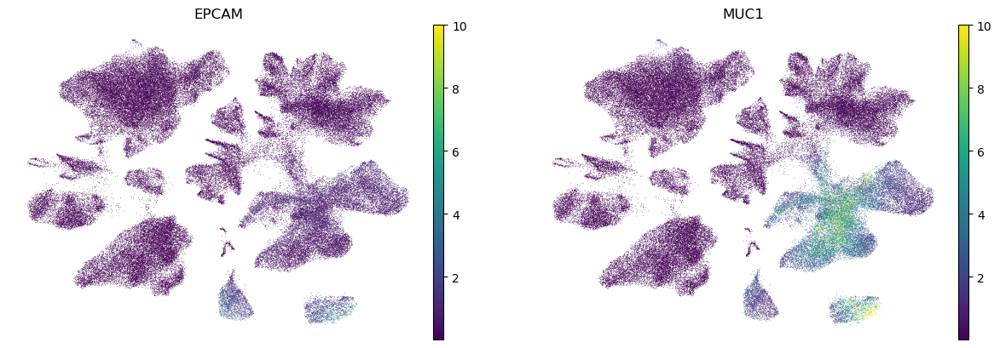

In [ ]:
sc.pl.umap(adata, color = ['EPCAM', 'MUC1'], frameon = False, layer = 'scvi_normalized', vmax = 10)
#EPCAM\MUC1均标记上皮细胞

In [79]:
markers[markers.names == 'MUC1']

,group,names,scores,logfoldchanges,pvals,pvals_adj
42765,2,MUC1,56.900806,3.449433,0.000000e+00,0.000000e+00
86430,4,MUC1,15.662324,1.059183,1.846730e-54,8.867802e-54
213093,10,MUC1,54.397888,3.878072,0.000000e+00,0.000000e+00
298464,14,MUC1,19.767130,2.188501,1.441835e-80,2.545131e-79
321920,15,MUC1,8.072545,0.911534,1.089491e-15,3.269393e-15
362351,17,MUC1,7.876402,1.096948,5.546238e-15,6.910418e-14
426285,20,MUC1,24.787903,3.028264,1.718923e-117,1.806778e-116


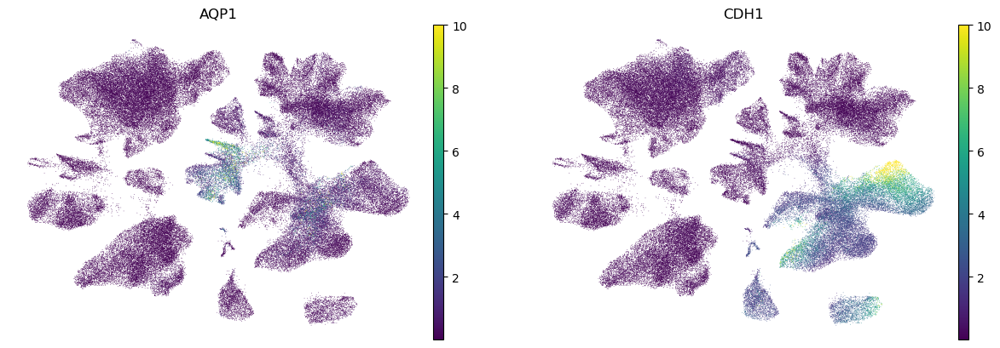

In [ ]:
sc.pl.umap(adata, color = ['AQP1','CDH1'], frameon = False, layer = 'scvi_normalized',vmax=10)
#AQP1和CDH1均为Airway epithelial cells标记

In [90]:
markers[markers.names == 'AQP1']


,group,names,scores,logfoldchanges,pvals,pvals_adj
149280,7,AQP1,35.511314,4.565219,3.212859e-249,6.852169e-248
213447,10,AQP1,23.568428,2.943144,2.404515e-116,2.988950e-115
362728,17,AQP1,4.124078,0.924268,3.878097e-05,1.653196e-04


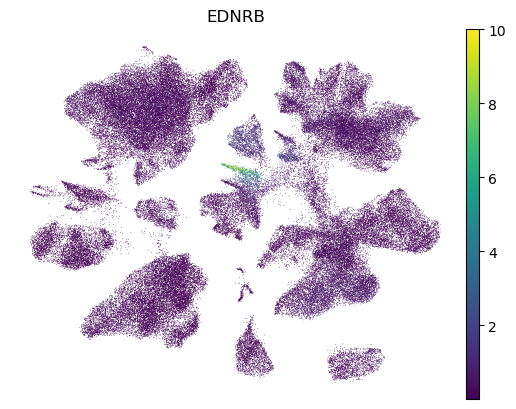

In [ ]:
sc.pl.umap(adata, color = ['EDNRB'], frameon = False, layer = 'scvi_normalized',vmax=10)
#EDNRB标记Aerocyte，是一种高度特化的肺部毛细血管内皮细胞

In [85]:
markers[markers.names == 'EDNRB']


,group,names,scores,logfoldchanges,pvals,pvals_adj
24565,1,EDNRB,6.509988,0.835355,7.873945e-11,1.905216e-10
45914,2,EDNRB,4.538999,0.623622,5.726733e-06,9.377020e-06
149649,7,EDNRB,17.393982,3.105433,4.825879e-66,3.626814e-65
405266,19,EDNRB,13.827250,3.400081,1.749622e-41,1.294806e-40
449129,21,EDNRB,4.589718,1.271485,4.737345e-06,1.003918e-05
533212,25,EDNRB,6.622078,2.364833,5.407115e-11,2.217594e-10


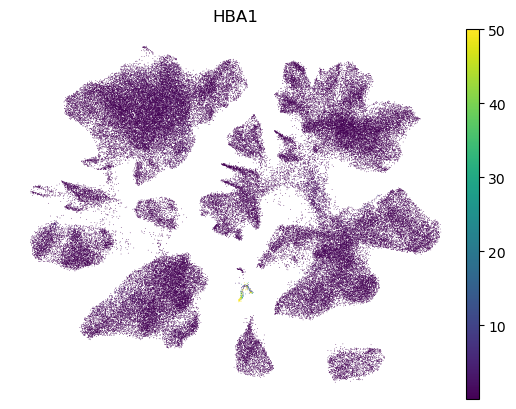

In [ ]:
sc.pl.umap(adata, color = ['HBA1'], frameon = False, layer = 'scvi_normalized',vmax=50)
#HBA1标记Erythroid-like cells

In [ ]:
markers[markers.names == 'HBA1']
#结合UMAP图，可以看到HBA1主要在cluster27中高表达，说明cluster27是Erythroid-like细胞群。


,group,names,scores,logfoldchanges,pvals,pvals_adj
362583,17,HBA1,5.028611,2.813757,5.397009e-07,3.125542e-06
575284,27,HBA1,16.305950,11.492769,8.989697e-40,2.001824e-39


目前还有cluster23\28没有确定身份，对于完全未知的细胞群可以查看它高表达的基因，在Panglao DB网站上检索

In [ ]:
markers_scvi[markers_scvi.group1 == '23'].head(20)
print (markers_scvi[markers_scvi.group1 == '23'].head(20))
#根据导出排名前20的marker基因，可以看到cluster23主要表达与神经元相关的基因，如WNK3\KIT等，说明cluster23可能是神经元细胞群。

,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2
AC063977.6,1.0000,0.0000,18.420681,0.000143,1.450682e-06,0.0,0.25,7.065119,7.089048,2.011261,...,0.111654,0.000894,0.096301,0.000866,1.333130,0.007278,True,23 vs Rest,23,Rest
SIGLEC6,1.0000,0.0000,18.420681,0.000264,1.546623e-06,0.0,0.25,8.236254,8.173162,2.238625,...,0.155618,0.000605,0.131193,0.000587,1.845772,0.004762,True,23 vs Rest,23,Rest
WNK3,1.0000,0.0000,18.420681,0.000151,4.953635e-06,0.0,0.25,5.440191,5.410815,1.582937,...,0.130495,0.005801,0.099791,0.005364,1.580634,0.044193,True,23 vs Rest,23,Rest
AC092979.1,1.0000,0.0000,18.420681,0.001975,5.029349e-06,0.0,0.25,9.855068,9.759020,2.566839,...,1.386611,0.001285,0.561759,0.000941,16.762226,0.008043,True,23 vs Rest,23,Rest
SLC18A2,1.0000,0.0000,18.420681,0.001337,9.229016e-06,0.0,0.25,8.067731,8.014423,2.073628,...,1.147252,0.004963,0.569435,0.004386,13.922201,0.038660,True,23 vs Rest,23,Rest
KIT,1.0000,0.0000,18.420681,0.003980,2.333461e-05,0.0,0.25,8.933716,8.721035,2.466942,...,3.480834,0.005420,0.882763,0.003343,42.699589,0.045162,True,23 vs Rest,23,Rest
SLC8A3,1.0000,0.0000,18.420681,0.000695,7.801360e-06,0.0,0.25,7.509470,7.543804,2.072178,...,0.563855,0.002132,0.349616,0.001685,6.878675,0.020157,True,23 vs Rest,23,Rest
LINC02645,1.0000,0.0000,18.420681,0.000247,1.770570e-06,0.0,0.25,7.833318,7.883581,2.051841,...,0.074668,0.000773,0.045359,0.000680,0.987711,0.006854,True,23 vs Rest,23,Rest
LINC02136,1.0000,0.0000,18.420681,0.000080,1.180415e-06,0.0,0.25,6.606328,6.665972,1.761719,...,0.075366,0.000708,0.067690,0.000652,0.961726,0.007549,True,23 vs Rest,23,Rest
GCSAML,1.0000,0.0000,18.420681,0.000067,8.669515e-07,0.0,0.25,6.700049,6.606484,1.785473,...,0.068388,0.000624,0.060712,0.000624,0.826269,0.005428,True,23 vs Rest,23,Rest


In [ ]:
markers_scvi[markers_scvi.group1 == '28'].head(20)
#根据导出排名前20的marker基因，可以看到cluster28主要表达


,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2
AL353595.1,1.0000,0.0000,18.420681,0.000056,1.873785e-06,0.0,0.25,5.325171,5.264619,1.409669,...,0.147541,0.001039,0.131148,0.001021,2.074279,0.009343,True,28 vs Rest,28,Rest
GABRA3,1.0000,0.0000,18.420681,0.000032,2.089084e-06,0.0,0.25,4.281036,4.261907,1.232678,...,0.147541,0.001480,0.147541,0.001425,1.594769,0.012286,True,28 vs Rest,28,Rest
LINC01885,1.0000,0.0000,18.420681,0.000028,1.098412e-06,0.0,0.25,4.926283,4.935131,1.294364,...,0.114754,0.000873,0.098361,0.000864,1.622301,0.006657,True,28 vs Rest,28,Rest
TRPM1,1.0000,0.0000,18.420681,0.000047,1.121633e-06,0.0,0.25,5.645092,5.650809,1.449917,...,0.163934,0.001094,0.147541,0.001076,2.055122,0.008056,True,28 vs Rest,28,Rest
AC025419.1,1.0000,0.0000,18.420681,0.000049,1.253992e-06,0.0,0.25,6.099822,6.075595,1.820145,...,0.114754,0.001159,0.098361,0.001131,1.513879,0.008645,True,28 vs Rest,28,Rest
RIT2,1.0000,0.0000,18.420681,0.000076,1.472422e-06,0.0,0.25,6.156260,6.186583,1.554516,...,0.163934,0.000975,0.163934,0.000975,2.293429,0.008863,True,28 vs Rest,28,Rest
NPSR1,1.0000,0.0000,18.420681,0.000080,1.297593e-06,0.0,0.25,6.385324,6.376830,1.512143,...,0.213115,0.000947,0.213115,0.000901,2.590852,0.006566,True,28 vs Rest,28,Rest
AL118511.1,1.0000,0.0000,18.420681,0.000012,1.258627e-06,0.0,0.25,3.590636,3.524396,1.229707,...,0.000000,0.001388,0.000000,0.001388,0.000000,0.009825,True,28 vs Rest,28,Rest
GPR158,1.0000,0.0000,18.420681,0.000061,2.917265e-06,0.0,0.25,4.772587,4.746302,1.202617,...,0.262295,0.002308,0.180328,0.002216,3.829885,0.017124,True,28 vs Rest,28,Rest
LINC01192,1.0000,0.0000,18.420681,0.000056,1.342331e-06,0.0,0.25,5.726614,5.833319,1.478385,...,0.196721,0.001113,0.180328,0.001085,2.538605,0.008733,True,28 vs Rest,28,Rest


In [138]:
for item in markers_scvi[markers_scvi.group1 == '28'][0:1000].index:
    print (item)#输出cluster28的前1000个marker基因名称，并导入enrichr进行细胞类型分析

AL353595.1
GABRA3
LINC01885
TRPM1
AC025419.1
RIT2
NPSR1
AL118511.1
GPR158
LINC01192
FSTL5
LINC00536
SEPTIN14
AL137781.1
AC096577.1
WNK3
NXNL2
ROPN1L
CA5A
STXBP5L
AC009435.1
MYT1L
HTR2C
NPHS1
CCDC187
LINC02008
TMEM212
KCNH4
UNC80
LINC01414
SLC28A1
LINC01234
AC079943.2
DNAH3
AL356295.1
LINC01492
LINC01162
CTNNA2
GABRB1
FABP6
SYT14
LINC02237
AC007402.1
LINC02811
CNTNAP5
CCDC17
CHRNB4
AC004554.2
CCDC33
SPAG17
LRRC71
RIIAD1
CFAP77
CFAP206
FRRS1L
PEG13
AL080317.1
SNTG1
AL121956.6
ADPRHL1
AC010519.1
LINC01900
DNAI1
TPTE
CFAP73
CASC20
DNAH9
NOL4
AC012494.1
PPP1R42
AC022523.1
KIAA2012-AS1
PTCSC2
AC006504.1
AC068025.1
FRMPD2
HNRNPA1L2
ARIH2OS
DPYSL5
Z96074.1
VWA3B
RNASEH1-AS1
LINC01630
DRC1
CCDC190
RSPH9
ZNF574
CFAP43
MYO18B
AL583829.1
TPSAB1
GAS2L2
CFAP100
AL162725.2
TAS2R46
CWH43
RSPH14
NRXN1
C10orf90
MYLPF
AL122014.1
SEL1L2
AL928654.1
DNAH6
TDRD1
KIAA2012
FKBP6
CLRN3
MORN5
ATP1A2
AC008946.1
AL158071.5
AC096570.1
CNTNAP2
AC055714.1
AL606804.1
DNAH12
C11orf16
AL139142.1
TRDN
DYDC1
ZBBX
CDHR4
AC

enrichr分析结果显示怀疑为室管膜细胞，再次进行验证

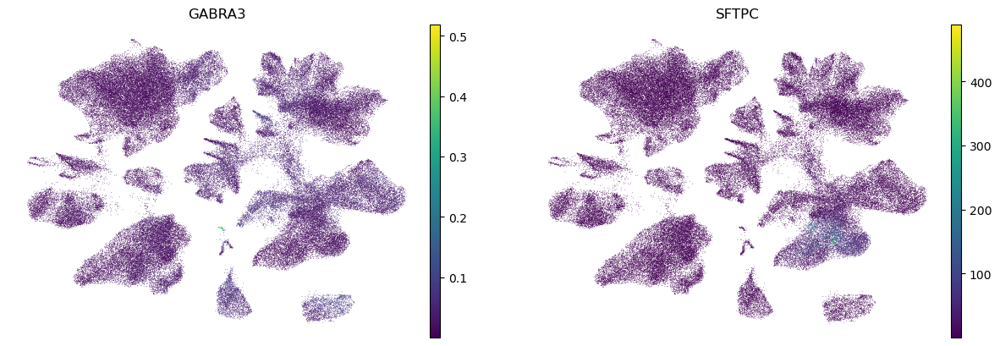

In [ ]:
sc.pl.umap(adata, color=['GABRA3','SFTPC'], layer='scvi_normalized', frameon=False)
#GABRA3标志神经元细胞
#SFTPC标志肺泡上皮细胞

In [143]:
markers[markers.names == 'GABRA3']
#最终确定cluster28也为神经元细胞群

,group,names,scores,logfoldchanges,pvals,pvals_adj
596804,28,GABRA3,3.135936,7.114903,0.002653,0.006052


In [144]:
cell_type = {"0":"Macrophage",
"1":"Fibroblast",
"2":"AT2",
"3":"CD4+ T-cell",
"4":"AT1",
"5":"Macrophage",
"6":"CD8+ T-cell",
"7":"Endothelial cell",
"8":"Monocyte",
"9":"Plasma cell",
"10":"AT2",
"11":"Macrophage",
"12":"Fibroblast",
"13":"Fibroblast",
"14":"Airway epithelial",
"15":"Airway epithelial",
"16":"Macrophage",
"17":"Airway epithelial",
"18":"B-cell",
"19":"Aerocyte",
"20":"Airway epithelial",
"21":"Smooth muscle cell",
"22":"Cycling T/NK",
"23":"Neuronal cell",
"24":"Denditic cell",
"25":"Pericyte",
"26":"Macrophage",
"27":"Erythroid-like",
"28":"Neuronal cell",
"29":"Macrophage"
}


In [ ]:
#for x in range(0, 30):
#    print(f'"{x}":"",' )
#生成细胞群注释模板

In [145]:
adata.obs['cell type'] = adata.obs.leiden.map(cell_type)

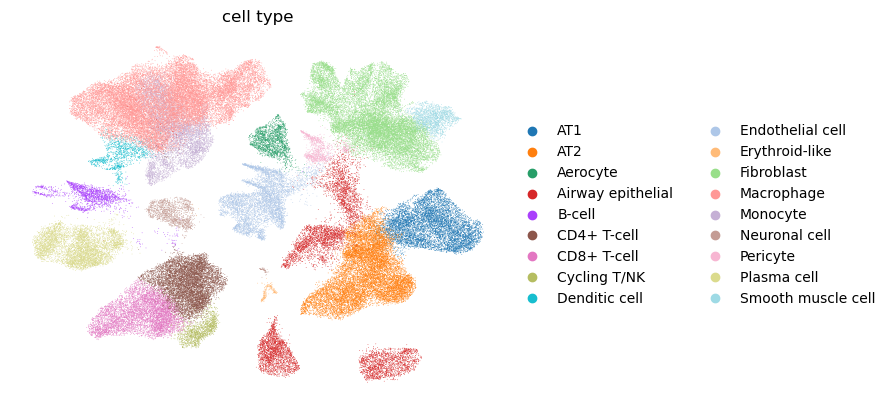

In [146]:
sc.pl.umap(adata, color = ['cell type'], frameon = False)

In [147]:
adata

AnnData object with n_obs × n_vars = 108822 × 21306
    obs: 'Sample', 'doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', '_scvi_batch', '_scvi_labels', 'leiden', '_scvi_raw_norm_scaling', 'cell type'
    var: 'n_cells'
    uns: 'log1p', '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'umap', 'leiden', 'leiden_colors', 'Sample_colors', 'rank_genes_groups', 'cell type_colors'
    obsm: '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs', 'X_scVI', 'X_umap'
    layers: 'counts', 'scvi_normalized'
    obsp: 'distances', 'connectivities'

In [148]:
adata.uns['scvi_markers'] = markers_scvi
adata.uns['markers'] = markers

In [149]:
adata.write_h5ad('integrated.h5ad')

In [ ]:
#model.save('model.model')
#保存训练好的scvi模型，但后续DE发现使用不了。

# Analysis

In [1]:
import scanpy as sc
import scvi
import seaborn as sns
import numpy as np
import pandas as pd

# Counting cells

In [2]:
adata = sc.read_h5ad('integrated.h5ad')

In [3]:
adata

AnnData object with n_obs × n_vars = 108822 × 21306
    obs: 'Sample', 'doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', '_scvi_batch', '_scvi_labels', 'leiden', '_scvi_raw_norm_scaling', 'cell type'
    var: 'n_cells'
    uns: 'Sample_colors', '_scvi_manager_uuid', '_scvi_uuid', 'cell type_colors', 'leiden', 'leiden_colors', 'log1p', 'markers', 'neighbors', 'rank_genes_groups', 'scvi_markers', 'umap'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    layers: 'counts', 'scvi_normalized'
    obsp: 'connectivities', 'distances'

In [4]:
adata.obs.Sample.unique().tolist()

['C57ctr',
 'L04cov',
 'C56ctr',
 'L16cov',
 'L21cov',
 'C54ctr',
 'L19cov',
 'L09cov',
 'L04covaddon',
 'L08cov',
 'C52ctr',
 'L11cov',
 'C53ctr',
 'L10cov',
 'L05cov',
 'L15cov',
 'L18cov',
 'C55ctr',
 'L17cov',
 'L12cov',
 'L07cov',
 'L03cov',
 'L06cov',
 'L13cov',
 'L22cov',
 'C51ctr',
 'L01cov']

In [5]:
def map_condition(x):
    if 'cov' in x:
        return 'COVID19'
    else:
        return 'control'
#定义一个函数，根据样本名称中的关键词将样本分类为COVID19或control

In [6]:
adata.obs['condition'] = adata.obs.Sample.map(map_condition)#新建一列'condition'，存储每个样本的状态信息
adata.obs#查看adta.obs，确认新列已添加

,Sample,doublet,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,_scvi_batch,_scvi_labels,leiden,_scvi_raw_norm_scaling,cell type,condition
CTCCAACCATACACCA-1_7,C57ctr,False,1812,1812,3962.0,0.0,0.0,1.0,0.025240,0,0,2,2.527806,AT2,control
TACTTACTCCATACTT-1_7,C57ctr,False,1845,1845,3643.0,0.0,0.0,1.0,0.027450,0,0,2,2.750275,AT2,control
CCTCCAAGTGACATCT-1_7,C57ctr,False,1864,1864,3438.0,0.0,0.0,10.0,0.290867,0,0,11,2.915452,Macrophage,control
GACTTCCAGACAACTA-1_7,C57ctr,False,1827,1827,3406.0,0.0,0.0,0.0,0.000000,0,0,2,2.941176,AT2,control
CAACGATGTTGCTCAA-1_7,C57ctr,False,1845,1845,3405.0,0.0,0.0,0.0,0.000000,0,0,2,2.945508,AT2,control
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TATCCTACATCCAATG-1_8,L01cov,False,332,332,420.0,0.0,0.0,0.0,0.000000,0,0,15,23.923445,Airway epithelial,COVID19
CGTGATAGTTTCGTAG-1_8,L01cov,False,329,329,411.0,0.0,0.0,0.0,0.000000,0,0,23,24.390244,Neuronal cell,COVID19
CTGTCGTTCTTTCTAG-1_8,L01cov,False,303,303,404.0,0.0,0.0,0.0,0.000000,0,0,4,24.875622,AT1,COVID19
GAGAAATTCATTGCGA-1_8,L01cov,False,305,305,405.0,0.0,0.0,0.0,0.000000,0,0,2,24.691359,AT2,COVID19


In [7]:
num_tot_cells = adata.obs.groupby(['Sample']).count()#对每个样本的细胞进行计数，但count()会对行数计数，每一列行数一致
num_tot_cells = dict(zip(num_tot_cells.index, num_tot_cells.doublet))#选择doublet列与index进行一一对应，并转换为字典形式
num_tot_cells

/var/folders/l2/f03q12kn4r9bx_07m87jc8wm0000gn/T/ipykernel_72245/4167017253.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  num_tot_cells = adata.obs.groupby(['Sample']).count()#对每个样本的细胞进行计数，但count()会对行数计数，每一列行数一致


{'C51ctr': 5960,
 'C52ctr': 4415,
 'C53ctr': 6928,
 'C54ctr': 4284,
 'C55ctr': 5565,
 'C56ctr': 3904,
 'C57ctr': 4687,
 'L01cov': 2952,
 'L03cov': 3953,
 'L04cov': 3401,
 'L04covaddon': 4386,
 'L05cov': 2696,
 'L06cov': 6306,
 'L07cov': 4753,
 'L08cov': 3767,
 'L09cov': 3368,
 'L10cov': 1501,
 'L11cov': 2888,
 'L12cov': 3648,
 'L13cov': 4732,
 'L15cov': 3905,
 'L16cov': 1773,
 'L17cov': 4341,
 'L18cov': 2633,
 'L19cov': 2429,
 'L21cov': 3257,
 'L22cov': 6390}

接下来是提取并整理一张细胞计数表，统计在不同的Sample和condition中，每种cell type中的细胞数目。

In [8]:
cell_type_counts = adata.obs.groupby(['Sample', 'condition', 'cell type']).count()#对每个样本的每种细胞类型进行计数，三级分组
cell_type_counts = cell_type_counts[cell_type_counts.sum(axis = 1) > 0].reset_index()#去除计数为0的行，并重置索引
cell_type_counts = cell_type_counts[cell_type_counts.columns[0:4]]#只保留前四列，即Sample, condition, cell type, doublet列
cell_type_counts#这里的doublet列实际上是每个分组的细胞数目

/var/folders/l2/f03q12kn4r9bx_07m87jc8wm0000gn/T/ipykernel_72245/102227974.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  cell_type_counts = adata.obs.groupby(['Sample', 'condition', 'cell type']).count()#对每个样本的每种细胞类型进行计数，三级分组


,Sample,condition,cell type,doublet
0,C51ctr,control,AT1,831
1,C51ctr,control,AT2,773
2,C51ctr,control,Aerocyte,31
3,C51ctr,control,Airway epithelial,452
4,C51ctr,control,B-cell,39
...,...,...,...,...
449,L22cov,COVID19,Monocyte,236
450,L22cov,COVID19,Neuronal cell,12
451,L22cov,COVID19,Pericyte,70
452,L22cov,COVID19,Plasma cell,541


In [9]:
cell_type_counts['total_cells'] = cell_type_counts.Sample.map(num_tot_cells).astype(int)#新建一列'total_cells'，存储每个样本的总细胞数目
cell_type_counts['frequency'] = cell_type_counts.doublet / cell_type_counts.total_cells
cell_type_counts

,Sample,condition,cell type,doublet,total_cells,frequency
0,C51ctr,control,AT1,831,5960,0.139430
1,C51ctr,control,AT2,773,5960,0.129698
2,C51ctr,control,Aerocyte,31,5960,0.005201
3,C51ctr,control,Airway epithelial,452,5960,0.075839
4,C51ctr,control,B-cell,39,5960,0.006544
...,...,...,...,...,...,...
449,L22cov,COVID19,Monocyte,236,6390,0.036933
450,L22cov,COVID19,Neuronal cell,12,6390,0.001878
451,L22cov,COVID19,Pericyte,70,6390,0.010955
452,L22cov,COVID19,Plasma cell,541,6390,0.084664


此时就获得了每个样本内细胞群数目的分布表格，接下来画小提琴图展示病理组对照组内细胞群占比差异。

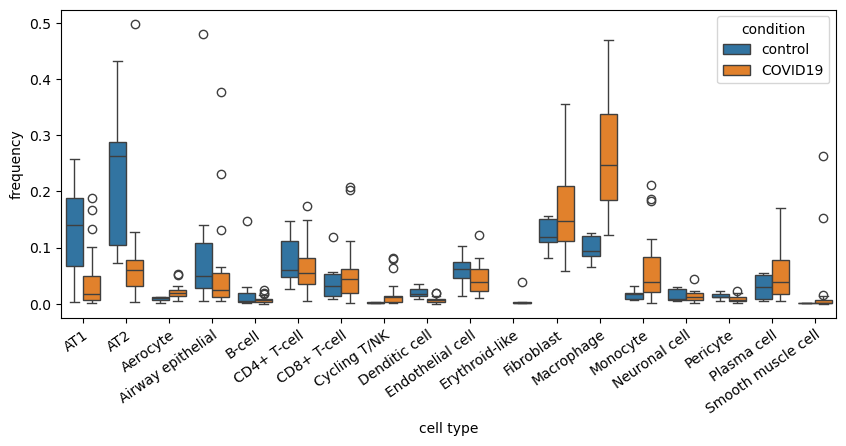

In [10]:
import matplotlib.pyplot as plt

plt.figure(figsize = (10,4))

ax = sns.boxplot(data = cell_type_counts, x = 'cell type', y = 'frequency', hue = 'condition')#hue参数用于根据不同的条件（condition）为数据点上色，从而区分COVID19和control两组数据

plt.xticks(rotation = 35, rotation_mode = 'anchor', ha = 'right')

plt.show()

# DE

差异基因分析two options: SCVI or diffxpy，我按照视频使用diffxpy进行DE但一直报错，所以放弃，直接用SCVI。但也不能直接照搬作者原代码，以下是我结合Gemini修改后的代码。

In [11]:
subset = adata[adata.obs['cell type'].isin(['AT1', 'AT2'])].copy()

In [12]:
sc.pp.filter_genes(subset, min_cells=100)

In [13]:
len(subset.var)

13547

In [14]:
subset.obs = subset.obs.rename(columns = {'cell type':'cell_type'})

In [15]:
subset.obs

,Sample,doublet,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,_scvi_batch,_scvi_labels,leiden,_scvi_raw_norm_scaling,cell_type,condition
CTCCAACCATACACCA-1_7,C57ctr,False,1812,1812,3962.0,0.0,0.0,1.0,0.02524,0,0,2,2.527806,AT2,control
TACTTACTCCATACTT-1_7,C57ctr,False,1845,1845,3643.0,0.0,0.0,1.0,0.02745,0,0,2,2.750275,AT2,control
GACTTCCAGACAACTA-1_7,C57ctr,False,1827,1827,3406.0,0.0,0.0,0.0,0.00000,0,0,2,2.941176,AT2,control
CAACGATGTTGCTCAA-1_7,C57ctr,False,1845,1845,3405.0,0.0,0.0,0.0,0.00000,0,0,2,2.945508,AT2,control
GGTGATTGTGTTAGCT-1_7,C57ctr,False,1818,1818,3279.0,0.0,0.0,0.0,0.00000,0,0,2,3.056235,AT2,control
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CCGGTAGGTTACCCAA-1_8,L01cov,False,344,344,418.0,0.0,0.0,0.0,0.00000,0,0,4,23.980816,AT1,COVID19
ACGTAGTGTGGAAGTC-1_8,L01cov,False,351,351,429.0,0.0,0.0,1.0,0.23310,0,0,4,23.310024,AT1,COVID19
GAGGGTACAGGCAATG-1_8,L01cov,False,316,316,402.0,0.0,0.0,0.0,0.00000,0,0,4,24.875622,AT1,COVID19
CTGTCGTTCTTTCTAG-1_8,L01cov,False,303,303,404.0,0.0,0.0,0.0,0.00000,0,0,4,24.875622,AT1,COVID19


In [16]:
#重新训练一个适配当前PyTorch 2.6+ 环境的模型
scvi.model.SCVI.setup_anndata(subset, layer="counts")
model = scvi.model.SCVI(subset)
model.train()

GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/setup.py:175: GPU available but not used. You can set it by doing `Trainer(accelerator='gpu')`.
/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=11` in the `DataLoader` to improve performance.


Epoch 400/400: 100%|██████████| 400/400 [50:51<00:00,  7.58s/it, v_num=1, train_loss_step=3.31e+3, train_loss_epoch=3.13e+3]

`Trainer.fit` stopped: `max_epochs=400` reached.


Epoch 400/400: 100%|██████████| 400/400 [50:51<00:00,  7.63s/it, v_num=1, train_loss_step=3.31e+3, train_loss_epoch=3.13e+3]


模型训练后进行差异基因分析

In [17]:
scvi_de = model.differential_expression(
    groupby="cell_type",
    group1="AT1",
    group2="AT2"
)
#根据细胞类型进行差异表达分析，比较AT1和AT2两种细胞类型之间的基因表达差异

DE...: 100%|██████████| 1/1 [00:03<00:00,  3.03s/it]


In [18]:
scvi_de

,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2
AL355499.1,0.9976,0.0024,6.029880,0.000898,0.000021,0.0,0.25,8.433361,8.226874,3.999913,...,1.405398,0.010369,0.564660,0.005778,9.021848,0.036028,True,AT1 vs AT2,AT1,AT2
TFPI,0.9972,0.0028,5.875328,0.000017,0.000517,0.0,0.25,-6.180894,-6.234959,2.419237,...,0.011845,0.835942,0.009755,0.399794,0.051472,5.056639,True,AT1 vs AT2,AT1,AT2
SH3GL3,0.9966,0.0034,5.680571,0.000117,0.000005,0.0,0.25,6.393217,6.433630,2.752287,...,0.189661,0.001583,0.141026,0.001504,1.214652,0.007657,True,AT1 vs AT2,AT1,AT2
PTGFR,0.9966,0.0034,5.680571,0.000006,0.000197,0.0,0.25,-6.564530,-6.683774,2.612675,...,0.001394,0.306956,0.001394,0.199937,0.007420,1.882065,True,AT1 vs AT2,AT1,AT2
CSF3R,0.9966,0.0034,5.680571,0.000019,0.000397,0.0,0.25,-5.220610,-5.224177,2.098485,...,0.007943,0.606477,0.007386,0.376999,0.038639,3.883244,True,AT1 vs AT2,AT1,AT2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
EXOC4,0.5144,0.4856,0.057616,0.000557,0.000594,0.0,0.25,-0.094914,-0.088616,0.415064,...,0.960855,1.037079,0.519091,0.544958,5.886151,6.103578,False,AT1 vs AT2,AT1,AT2
LRBA,0.5098,0.4902,0.039205,0.000903,0.000948,0.0,0.25,-0.071700,-0.071598,0.410610,...,1.359271,1.555778,0.623049,0.661944,8.189335,9.140226,False,AT1 vs AT2,AT1,AT2
SENP6,0.4976,0.5024,-0.009600,0.000310,0.000337,0.0,0.25,-0.123366,-0.116271,0.376239,...,0.509761,0.581307,0.360089,0.392591,3.225721,3.506341,False,AT1 vs AT2,AT1,AT2
ERC1,0.4934,0.5066,-0.026402,0.000450,0.000427,0.0,0.25,0.080068,0.078256,0.375731,...,0.701932,0.681912,0.432971,0.431613,4.297347,4.106212,False,AT1 vs AT2,AT1,AT2


In [19]:
scvi_de = scvi_de[(scvi_de['is_de_fdr_0.05']) & (abs(scvi_de.lfc_mean) > .5)]#保留显著差异（FDR<0.05）且差异倍数（LFC）大于0.5的基因
scvi_de = scvi_de.sort_values('lfc_mean')#按照差异倍数升序排序
scvi_de

,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2
CHIA,0.9928,0.0072,4.926447,2.572013e-07,2.813955e-05,0.0,0.25,-8.073164,-8.237146,4.340325,...,0.000279,0.025408,0.000279,0.018284,0.001043,0.158359,True,AT1 vs AT2,AT1,AT2
DMBT1,0.9942,0.0058,5.144079,6.466443e-06,4.868486e-04,0.0,0.25,-7.670105,-7.780465,3.312230,...,0.002090,0.681189,0.002090,0.220437,0.011269,4.145463,True,AT1 vs AT2,AT1,AT2
AC079015.1,0.9912,0.0088,4.724163,4.881565e-07,2.471577e-05,0.0,0.25,-7.518049,-7.587881,3.972933,...,0.000418,0.020579,0.000418,0.017255,0.001784,0.115867,True,AT1 vs AT2,AT1,AT2
SFTPA1,0.9906,0.0094,4.657600,2.705072e-05,7.140806e-04,0.0,0.25,-7.162083,-7.215222,3.827546,...,0.008222,1.378765,0.004320,0.348108,0.045929,7.428567,True,AT1 vs AT2,AT1,AT2
AC000061.1,0.9884,0.0116,4.445082,1.368562e-06,4.363967e-05,0.0,0.25,-6.945977,-6.864344,3.990864,...,0.000557,0.057622,0.000557,0.041475,0.002625,0.310999,True,AT1 vs AT2,AT1,AT2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
NCKAP5-AS2,0.9960,0.0040,5.517450,4.003661e-04,6.727828e-06,0.0,0.25,7.673592,7.546564,3.523821,...,0.682838,0.003008,0.301003,0.002216,4.228510,0.014768,True,AT1 vs AT2,AT1,AT2
ANKRD1,0.9892,0.0108,4.517349,4.723042e-04,2.102001e-05,0.0,0.25,7.821965,7.897769,4.212307,...,0.684786,0.015276,0.165412,0.006095,4.333440,0.101051,True,AT1 vs AT2,AT1,AT2
SEMA3E,0.9936,0.0064,5.045035,1.307542e-04,1.576383e-06,0.0,0.25,8.090887,8.154787,4.134353,...,0.178652,0.000000,0.110647,0.000000,1.066639,0.000000,True,AT1 vs AT2,AT1,AT2
AL807742.1,0.9942,0.0058,5.144079,5.485537e-05,7.265053e-07,0.0,0.25,8.224444,8.257837,3.968241,...,0.045847,0.000000,0.032609,0.000000,0.263006,0.000000,True,AT1 vs AT2,AT1,AT2


LFC=log(group1/group2)，所以LFC为正值说明该基因在AT1表达更高，负值说明在AT2表达更高。

In [20]:
scvi_de = scvi_de[(scvi_de.raw_normalized_mean1 > .5) | (scvi_de.raw_normalized_mean2 > .5)]#保留至少在一个组中归一化后的表达量大于0.5的基因
scvi_de

,proba_de,proba_not_de,bayes_factor,scale1,scale2,pseudocounts,delta,lfc_mean,lfc_median,lfc_std,...,raw_mean1,raw_mean2,non_zeros_proportion1,non_zeros_proportion2,raw_normalized_mean1,raw_normalized_mean2,is_de_fdr_0.05,comparison,group1,group2
DMBT1,0.9942,0.0058,5.144079,0.000006,0.000487,0.0,0.25,-7.670105,-7.780465,3.312230,...,0.002090,0.681189,0.002090,0.220437,0.011269,4.145463,True,AT1 vs AT2,AT1,AT2
SFTPA1,0.9906,0.0094,4.657600,0.000027,0.000714,0.0,0.25,-7.162083,-7.215222,3.827546,...,0.008222,1.378765,0.004320,0.348108,0.045929,7.428567,True,AT1 vs AT2,AT1,AT2
DEC1,0.9862,0.0138,4.269190,0.000003,0.000139,0.0,0.25,-6.767775,-6.803121,3.979795,...,0.001812,0.191785,0.001672,0.064667,0.007070,1.259429,True,AT1 vs AT2,AT1,AT2
AC096531.2,0.9958,0.0042,5.468460,0.000010,0.000569,0.0,0.25,-6.585647,-6.720731,2.520791,...,0.005017,1.035645,0.004041,0.411113,0.027125,6.635521,True,AT1 vs AT2,AT1,AT2
PTGFR,0.9966,0.0034,5.680571,0.000006,0.000197,0.0,0.25,-6.564530,-6.683774,2.612675,...,0.001394,0.306956,0.001394,0.199937,0.007420,1.882065,True,AT1 vs AT2,AT1,AT2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
AP003025.1,0.9888,0.0112,4.480577,0.000477,0.000025,0.0,0.25,7.646579,7.764139,4.422945,...,0.601315,0.029840,0.265747,0.017176,3.903984,0.157065,True,AT1 vs AT2,AT1,AT2
NCKAP5-AS2,0.9960,0.0040,5.517450,0.000400,0.000007,0.0,0.25,7.673592,7.546564,3.523821,...,0.682838,0.003008,0.301003,0.002216,4.228510,0.014768,True,AT1 vs AT2,AT1,AT2
ANKRD1,0.9892,0.0108,4.517349,0.000472,0.000021,0.0,0.25,7.821965,7.897769,4.212307,...,0.684786,0.015276,0.165412,0.006095,4.333440,0.101051,True,AT1 vs AT2,AT1,AT2
SEMA3E,0.9936,0.0064,5.045035,0.000131,0.000002,0.0,0.25,8.090887,8.154787,4.134353,...,0.178652,0.000000,0.110647,0.000000,1.066639,0.000000,True,AT1 vs AT2,AT1,AT2


In [21]:
genes_to_show = scvi_de[-25:].index.tolist() + scvi_de[:25].index.tolist() #top 25 and bottom 25 from sorted df

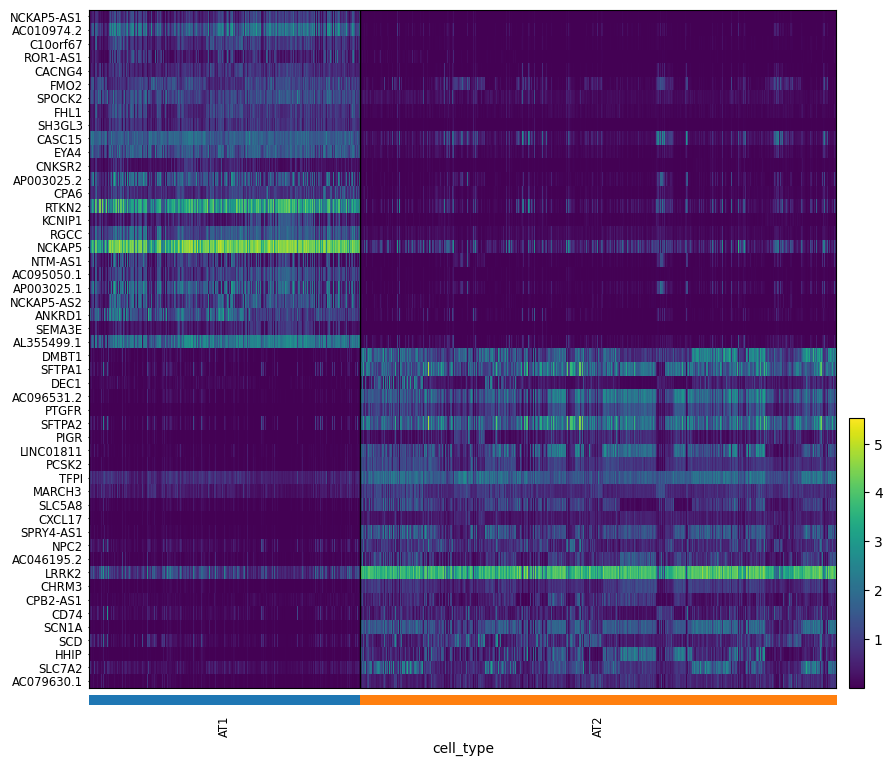

In [22]:
sc.pl.heatmap(subset, genes_to_show, groupby='cell_type', swap_axes=True, layer = 'scvi_normalized',
              log = True)
#使用scvi_normalized层的数据绘制热图

和作者跑出的热图不一致原因：模型训练的随机性、基因过滤的差异、版本进化

# GO enrichment

In [75]:
import gseapy as gp#this method requires internet connection
print(gp.__version__)

1.1.11


In [76]:
gp.get_library_name()
#'GO_Biological_Process_2025'
#'KEGG_2021_Human'

['ARCHS4_Cell-lines',
 'ARCHS4_IDG_Coexp',
 'ARCHS4_Kinases_Coexp',
 'ARCHS4_TFs_Coexp',
 'ARCHS4_Tissues',
 'Achilles_fitness_decrease',
 'Achilles_fitness_increase',
 'Aging_Perturbations_from_GEO_down',
 'Aging_Perturbations_from_GEO_up',
 'Allen_Brain_Atlas_10x_scRNA_2021',
 'Allen_Brain_Atlas_down',
 'Allen_Brain_Atlas_up',
 'Azimuth_2023',
 'Azimuth_Cell_Types_2021',
 'BioCarta_2013',
 'BioCarta_2015',
 'BioCarta_2016',
 'BioPlanet_2019',
 'BioPlex_2017',
 'CCLE_Proteomics_2020',
 'CM4AI_U2OS_Protein_Localization_Assemblies',
 'COMPARTMENTS_Curated_2025',
 'COMPARTMENTS_Experimental_2025',
 'CORUM',
 'COVID-19_Related_Gene_Sets',
 'COVID-19_Related_Gene_Sets_2021',
 'Cancer_Cell_Line_Encyclopedia',
 'CellMarker_2024',
 'CellMarker_Augmented_2021',
 'ChEA_2013',
 'ChEA_2015',
 'ChEA_2016',
 'ChEA_2022',
 'Chromosome_Location',
 'Chromosome_Location_hg19',
 'ClinVar_2019',
 'ClinVar_2025',
 'DGIdb_Drug_Targets_2024',
 'DSigDB',
 'Data_Acquisition_Method_Most_Popular_Genes',
 'DepMa

In [77]:
subset

AnnData object with n_obs × n_vars = 19810 × 13547
    obs: 'Sample', 'doublet', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', '_scvi_batch', '_scvi_labels', 'leiden', '_scvi_raw_norm_scaling', 'cell_type', 'condition', 'datp'
    var: 'n_cells'
    uns: 'Sample_colors', '_scvi_manager_uuid', '_scvi_uuid', 'cell type_colors', 'leiden', 'leiden_colors', 'log1p', 'markers', 'neighbors', 'rank_genes_groups', 'scvi_markers', 'umap', 'cell_type_colors', 'condition_colors'
    obsm: 'X_scVI', 'X_umap', '_scvi_extra_categorical_covs', '_scvi_extra_continuous_covs'
    layers: 'counts', 'scvi_normalized'
    obsp: 'connectivities', 'distances'

In [78]:
at1_up_genes = scvi_de[scvi_de.lfc_mean > 0.5].index.tolist()#提取 AT1 组显著高表达的基因 (LFC > 0.5)
at2_up_genes = scvi_de[scvi_de.lfc_mean < -0.5].index.tolist()#提取 AT2 组显著高表达的基因 (LFC < -0.5)
print(f"准备分析的 AT1 基因数: {len(at1_up_genes)}")
print(f"准备分析的 AT2 基因数: {len(at2_up_genes)}")

准备分析的 AT1 基因数: 425
准备分析的 AT2 基因数: 423


对AT1高表达基因进行富集分析

In [79]:
enr = gp.enrichr(gene_list= at1_up_genes,#选择AT1高表达基因进行富集分析
                 gene_sets=['KEGG_2021_Human','GO_Biological_Process_2025'],
                 organism='human', # don't forget to set organism to the one you desired!
                 outdir=None, # don't write to disk,
                 background = subset.var_names.tolist()#use all genes in the dataset as background
                )

In [80]:
enr.results#查看富集分析结果

,Gene_set,Term,P-value,Adjusted P-value,Old P-value,Old adjusted P-value,Odds Ratio,Combined Score,Genes
0,KEGG_2021_Human,Positive Regulation of Cell Migration (GO:0030...,2.417642e-07,0.000481,0,0,3.894161,59.328719,SEMA5A;EDN1;TGFB2;CD151;BMPR2;ANXA3;SEMA6D;CAV...
1,KEGG_2021_Human,Positive Regulation of Cell Motility (GO:2000147),6.487478e-07,0.000646,0,0,4.525334,64.477966,SEMA5A;EDN1;CD151;CAVIN1;SEMA6D;CAV1;RDX;SEMA3...
2,KEGG_2021_Human,Substrate Adhesion-Dependent Cell Spreading (G...,6.202359e-06,0.003286,0,0,12.909513,154.792561,LAMA5;PEAK1;PXDN;ILK;PARVA;RADIL;TEK
3,KEGG_2021_Human,Regulation of Cell Migration (GO:0030334),6.601355e-06,0.003286,0,0,2.975000,35.486501,SEMA5A;CD151;SEMA3B;PDGFA;NEXN;LAMC2;PRR5L;SEM...
4,KEGG_2021_Human,Synapse Organization (GO:0050808),1.039603e-05,0.004140,0,0,5.882789,67.499627,GPM6A;FARP1;PPFIBP1;BDNF;CNTN6;CTNND2;SPOCK2;P...
...,...,...,...,...,...,...,...,...,...
3977,GO_Biological_Process_2025,Proteasome-Mediated Ubiquitin-Dependent Protei...,9.978361e-01,0.999595,0,0,0.234818,0.000509,RHOBTB3;FBXL7
3978,GO_Biological_Process_2025,mRNA Processing (GO:0006397),9.983202e-01,0.999595,0,0,0.153945,0.000259,PPARGC1A
3979,GO_Biological_Process_2025,Proteasomal Protein Catabolic Process (GO:0010...,9.990428e-01,0.999595,0,0,0.211448,0.000203,WFS1;RHOBTB3
3980,GO_Biological_Process_2025,DNA Metabolic Process (GO:0006259),9.994747e-01,0.999595,0,0,0.129898,0.000068,SP100


本来应该画一个气泡图显示富集效果，但画得不好看遂删除。

# Comparisons

/opt/miniconda3/envs/scanpy_env/lib/python3.9/site-packages/scanpy/plotting/_utils.py:487: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


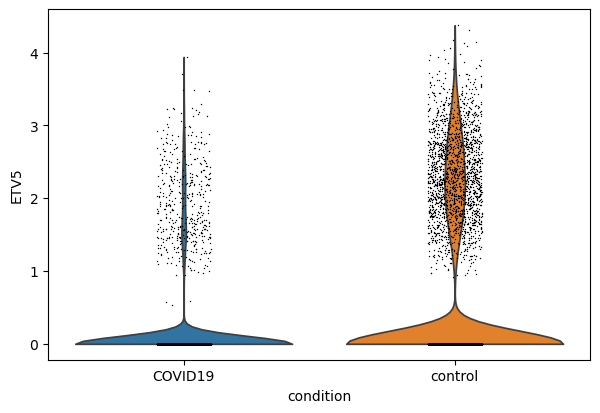

In [ ]:
sc.pl.violin(subset[subset.obs.cell_type == 'AT2'], 'ETV5', groupby='condition')#绘制ETV5基因在AT2细胞中不同状态下的表达小提琴图

In [58]:
from scipy import stats#用于进行统计分析
import numpy as np

In [ ]:
temp = subset[subset.obs.cell_type == 'AT2']#筛选出AT2细胞子集
i = np.where(temp.var_names == 'ETV5')[0][0]#找到ETV5基因在var_names中的索引位置

In [ ]:
a = temp[temp.obs.condition == 'COVID19'].X[:,i].toarray().flatten()#提取COVID19组中ETV5基因的表达数据，并展平成一维数组
b = temp[temp.obs.condition == 'control'].X[:,i].toarray().flatten()#提取control组中ETV5基因的表达数据，并展平成一维数组

In [62]:
stats.mannwhitneyu(a, b)

MannwhitneyuResult(statistic=15759653.5, pvalue=1.141144341713793e-136)

返回的结果显示ETV5在COVID19和control间存在巨大差异

# Score gene signature

分析“某一组功能相关的基因（即 Signature）”在细胞中的整体活跃程度。

In [63]:
#gene signature, ie, input list of genes from user
with open('datp_sig.txt') as f:
    datp_sig = [x.strip() for x in list(f)]

In [ ]:
sc.tl.score_genes(subset, datp_sig, score_name = 'datp')#新增一列'datp'，表示每个细胞的DATP基因集评分
#DATP (Damage Associated Transient Progenitor) 是肺部受损后出现的一种再生过程中的过渡态细胞。

In [ ]:
subset.obs
#dapt列中的数值表示每个细胞在DATP基因集上的评分，数值越高，说明该细胞越接近DATP状态

,Sample,doublet,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,_scvi_batch,_scvi_labels,leiden,_scvi_raw_norm_scaling,cell_type,condition,datp
CTCCAACCATACACCA-1_7,C57ctr,False,1812,1812,3962.0,0.0,0.0,1.0,0.02524,0,0,2,2.527806,AT2,control,0.005054
TACTTACTCCATACTT-1_7,C57ctr,False,1845,1845,3643.0,0.0,0.0,1.0,0.02745,0,0,2,2.750275,AT2,control,-0.114598
GACTTCCAGACAACTA-1_7,C57ctr,False,1827,1827,3406.0,0.0,0.0,0.0,0.00000,0,0,2,2.941176,AT2,control,0.031713
CAACGATGTTGCTCAA-1_7,C57ctr,False,1845,1845,3405.0,0.0,0.0,0.0,0.00000,0,0,2,2.945508,AT2,control,0.038038
GGTGATTGTGTTAGCT-1_7,C57ctr,False,1818,1818,3279.0,0.0,0.0,0.0,0.00000,0,0,2,3.056235,AT2,control,-0.110166
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CCGGTAGGTTACCCAA-1_8,L01cov,False,344,344,418.0,0.0,0.0,0.0,0.00000,0,0,4,23.980816,AT1,COVID19,-0.068181
ACGTAGTGTGGAAGTC-1_8,L01cov,False,351,351,429.0,0.0,0.0,1.0,0.23310,0,0,4,23.310024,AT1,COVID19,0.133251
GAGGGTACAGGCAATG-1_8,L01cov,False,316,316,402.0,0.0,0.0,0.0,0.00000,0,0,4,24.875622,AT1,COVID19,0.324921
CTGTCGTTCTTTCTAG-1_8,L01cov,False,303,303,404.0,0.0,0.0,0.0,0.00000,0,0,4,24.875622,AT1,COVID19,0.115792


接下来是可视化dapt评分效果

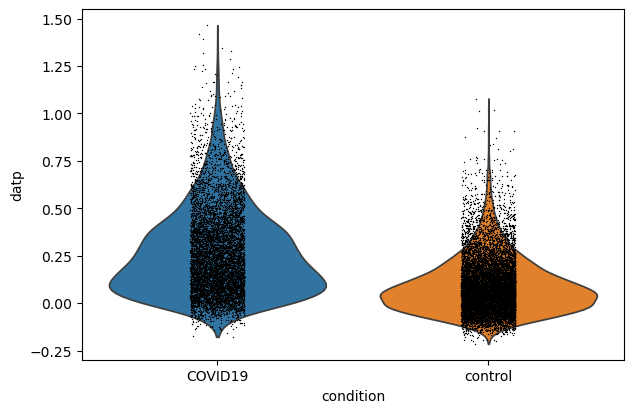

In [66]:
sc.pl.violin(subset, 'datp', groupby='condition')

In [67]:
a = subset[subset.obs.condition == 'COVID19'].obs.datp.values
b = subset[subset.obs.condition == 'control'].obs.datp.values
stats.mannwhitneyu(a, b)

MannwhitneyuResult(statistic=69892421.0, pvalue=0.0)

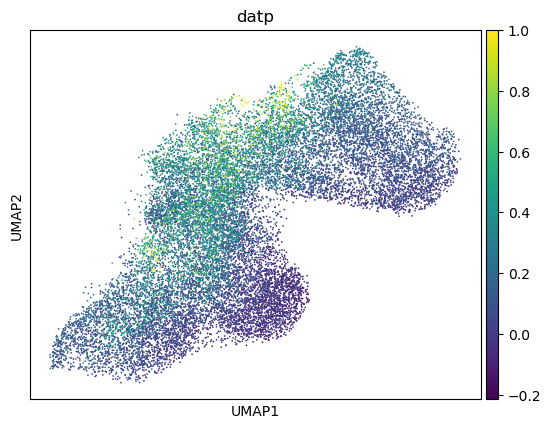

In [68]:
sc.pl.umap(subset, color = 'datp', vmax = 1)